<a href="https://colab.research.google.com/github/Pakeeru/Respiratory-Health-Project/blob/main/Respiratory_Health_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# install packages
install.packages("GGally")
install.packages("car")
install.packages("multcomp")
install.packages("plotly")
install.packages("corrplot")
install.packages("modelsummary")
install.packages("readxl")
install.packages("caret")
install.packages("leaps")
install.packages("car")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [ ]:
# load libraries
library("corrplot")
library("lattice")
library("dplyr")
library("plotly")
library("ggplot2")
library("GGally")
library("car")
library("multcomp")
library("modelsummary")
library("tidyverse")
library("readxl")
library("leaps")
library("caret")

In [ ]:
project_data<- read_excel("/content/sample_data/copd_data(1).xlsx")
head(project_data)

sid,visit_year,visit_date,visit_age,gender,race,height_cm,weight_kg,sysBP,diasBP,⋯,total_lung_capacity,pct_emphysema,functional_residual_capacity,pct_gastrapping,insp_meanatt,exp_meanatt,FEV1_FVC_ratio,FEV1,FVC,FEV1_phase2
<chr>,<dbl>,<dttm>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
10005Q,2008,2008-01-15,54.5,Female,White,159.9,73.0,130,80,⋯,5.6636,0.926851,2.4766,6.80077,-830.343,-650.526,0.77,2.921,3.805,2.622
10055F,2008,2008-03-15,69.0,Male,Black or African American,178.0,90.7,168,100,⋯,4.9060,1.945200,1.9057,10.68350,-823.746,-638.442,0.73,2.917,3.999,2.439
10056H,2008,2008-02-15,48.7,Female,White,153.7,86.2,100,53,⋯,4.8654,11.383200,4.0606,47.88110,-836.281,-797.471,0.29,0.374,1.281,0.379
10057J,2008,2008-04-15,56.8,Male,White,170.0,79.7,131,68,⋯,7.0991,7.525360,4.0210,27.83840,-856.567,-756.317,0.51,2.266,4.425,1.464
10060Y,2008,2008-05-15,72.8,Male,White,177.0,89.6,147,71,⋯,7.3304,19.262300,5.3342,53.47470,-867.254,-821.256,0.29,0.706,2.424,1.405
10068O,2008,2008-03-15,76.2,Female,White,155.0,55.0,134,78,⋯,6.0099,41.775700,4.1552,66.16210,-903.436,-856.337,0.46,0.806,1.736,0.580


In [ ]:
install.packages("skimr")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [ ]:
library(skimr)

In [ ]:
skim(project_data)

── Data Summary ────────────────────────
                           Values      
Name                       project_data
Number of rows             2747        
Number of columns          35          
_______________________                
Column type frequency:                 
  character                11          
  numeric                  23          
  POSIXct                  1           
________________________               
Group variables            None        

── Variable type: character ────────────────────────────────────────────────────
   skim_variable      n_missing complete_rate min max empty n_unique whitespace
 1 sid                        0             1   6   6     0     2747          0
 2 gender                     0             1   4   6     0        2          0
 3 race                       0             1   5  25     0        2          0
 4 asthma                     0             1   2   3     0        2          0
 5 bronchitis_attack          0      

Warning message in is.null(text_repr) || nchar(text_repr) == 0L:
“'length(x) = 3 > 1' in coercion to 'logical(1)'”


Warning message in warn_if_args_exist(list(...)):
“Extra arguments: 'binwidth' are being ignored.  If these are meant to be aesthetics, submit them using the 'mapping' variable within ggpairs with ggplot2::aes or ggplot2::aes_string.”


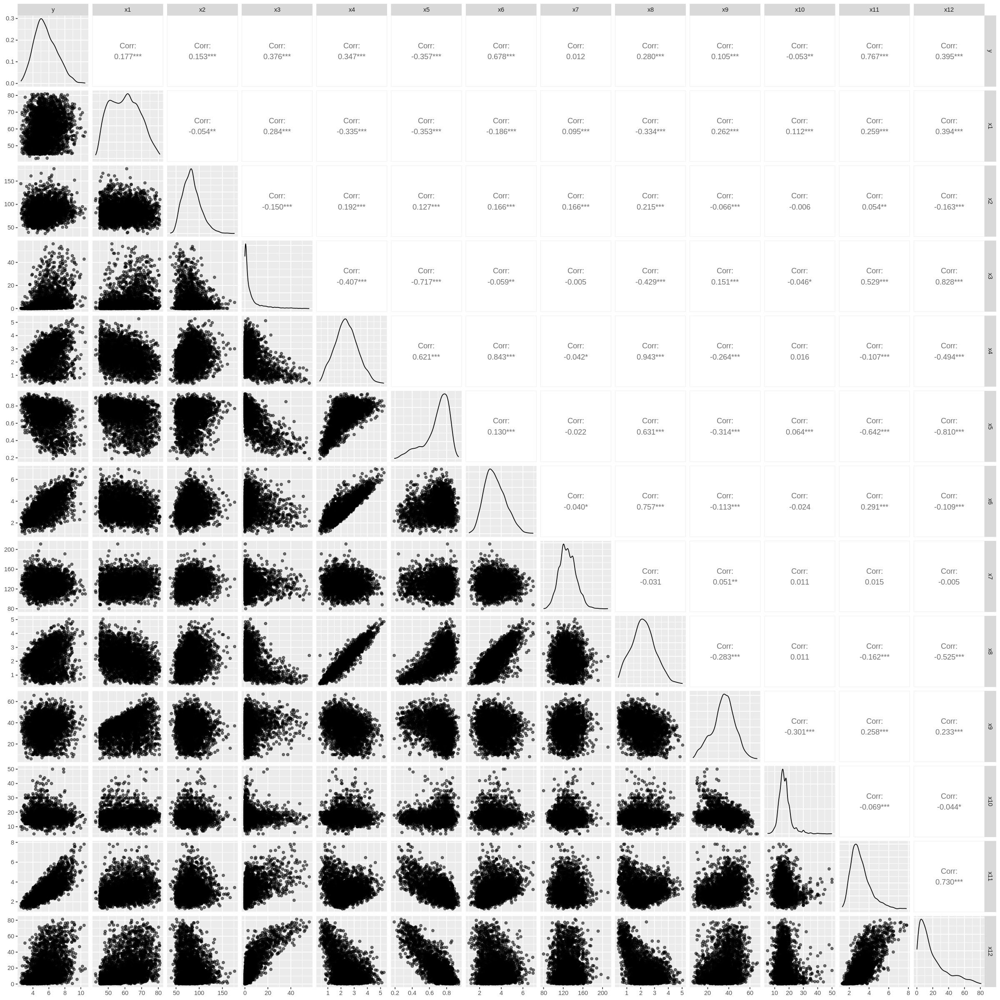

In [ ]:
options(repr.plot.width= 20, repr.plot.height=20)
y=project_data$total_lung_capacity
x1=project_data$visit_age
x2=project_data$weight_kg
x3=project_data$pct_emphysema
x4=project_data$FEV1
x5=project_data$FEV1_FVC_ratio
x6=project_data$FVC
x7=project_data$sysBP
x8=project_data$FEV1_phase2
x9=project_data$Duration_Smoking
x10=project_data$SmokStartAge
x11=project_data$functional_residual_capacity
x12=project_data$pct_gastrapping
plot_frame <- data.frame(y,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12)
ggpairs(plot_frame, aes(alpha=0.5), binwidth=30)

[1] 0.3838384


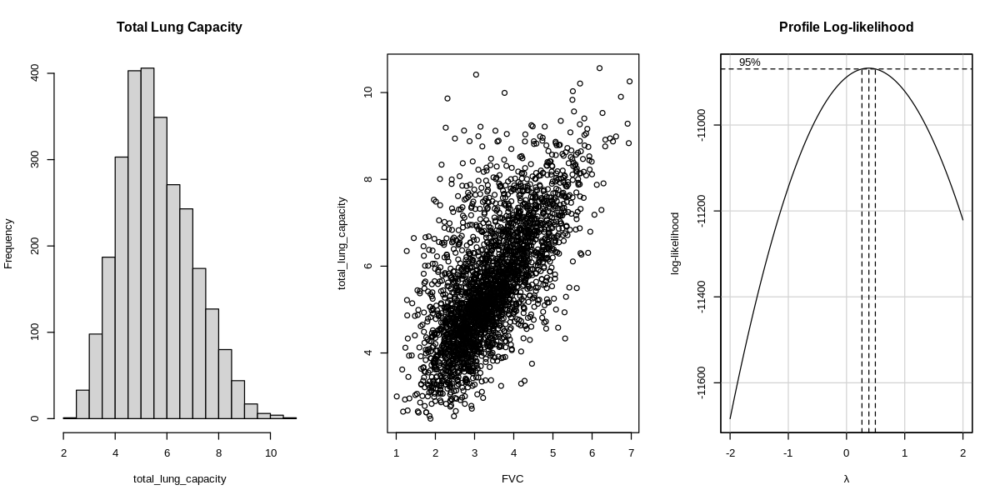

In [ ]:
options(repr.plot.width=10, repr.plot.height = 5)
par(mfrow = c(1,3))
with(project_data, hist(total_lung_capacity, main = "Total Lung Capacity"))
plot(total_lung_capacity ~ FVC, project_data)
bc = boxCox(lm(total_lung_capacity ~ FVC, data = project_data))
pow <- bc$x[which.max(bc$y)]
print(pow)

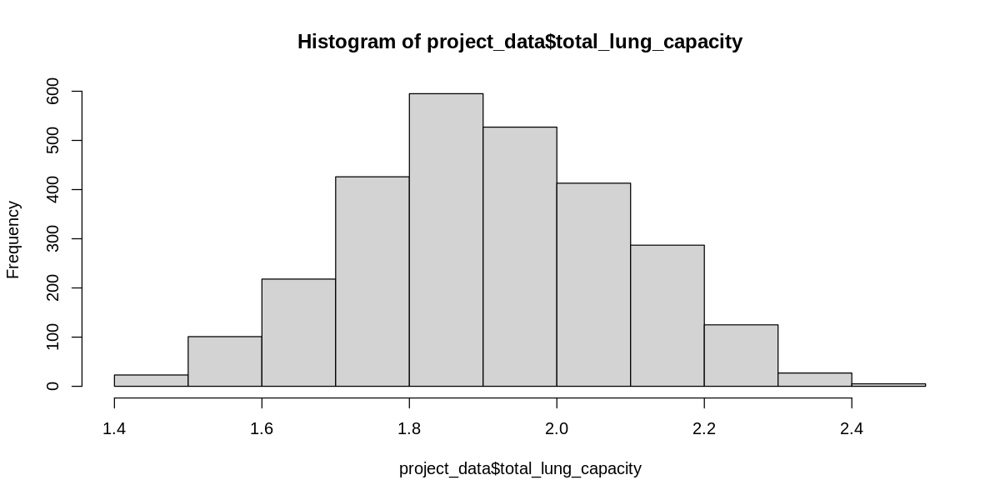

In [ ]:
project_data$total_lung_capacity <- project_data$total_lung_capacity^0.38
options(repr.plot.width=10, repr.plot.height = 5)
hist(project_data$total_lung_capacity)

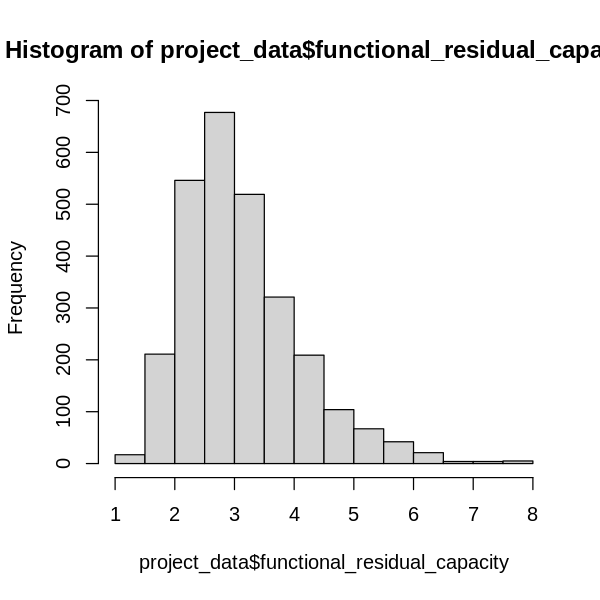

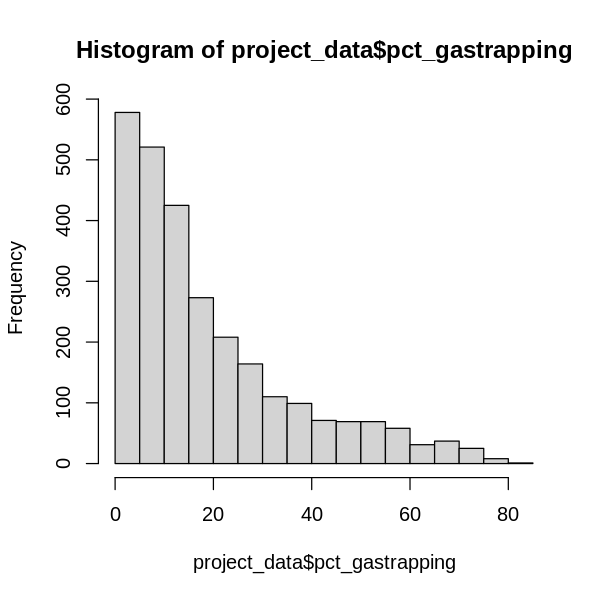

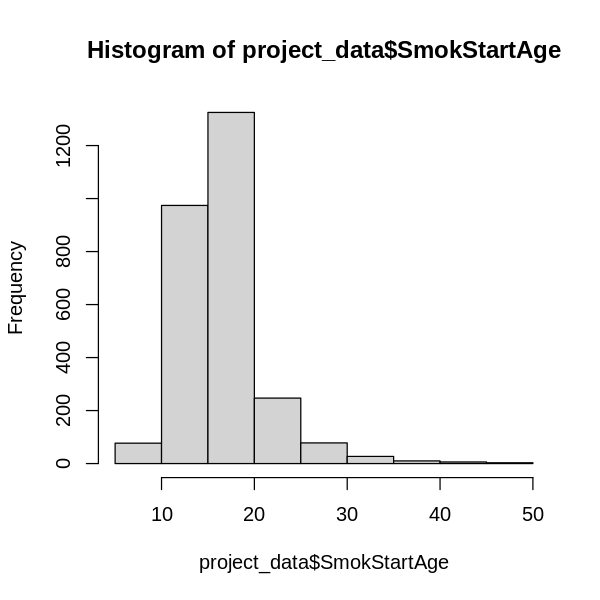

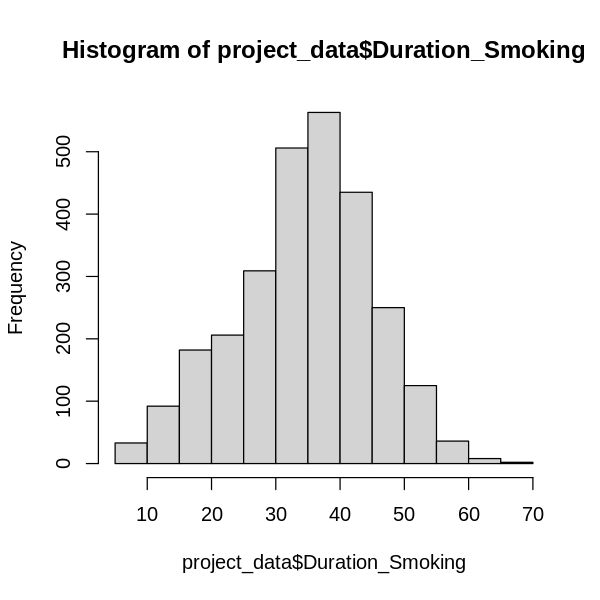

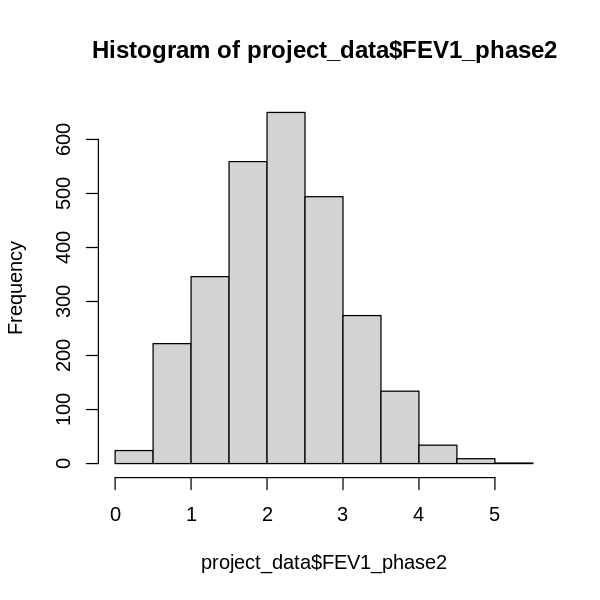

...

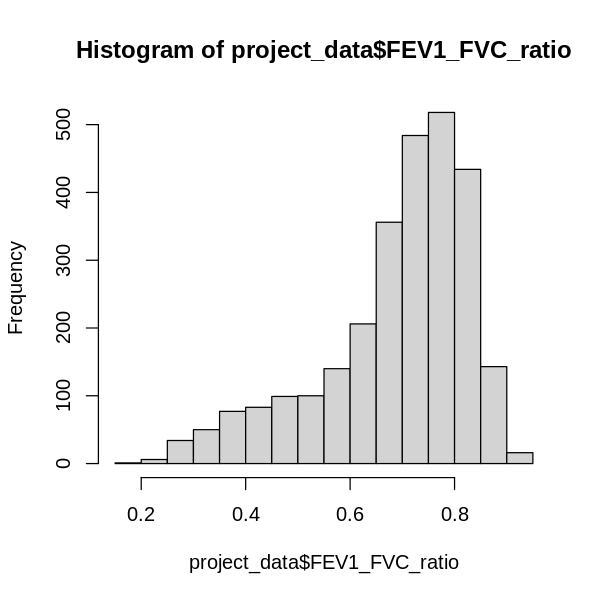

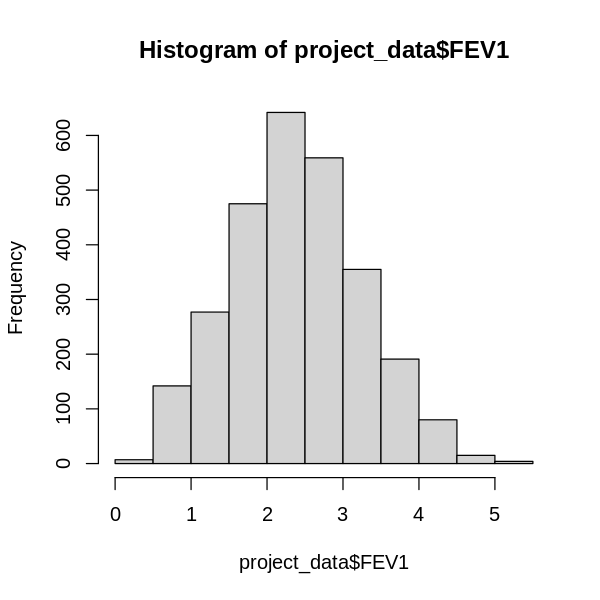

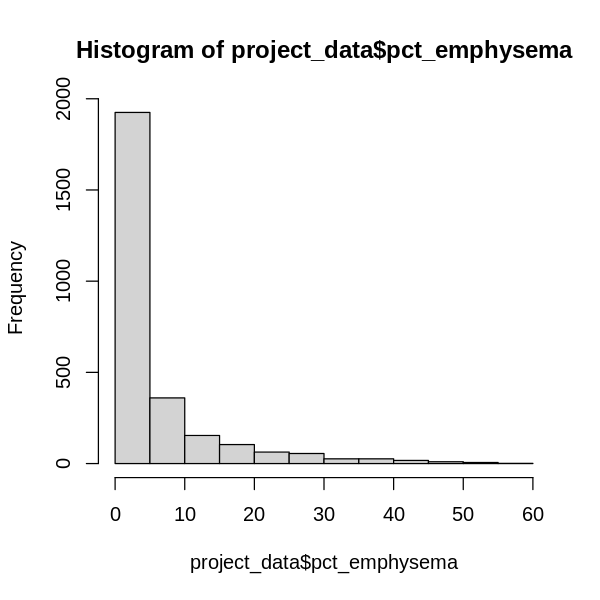

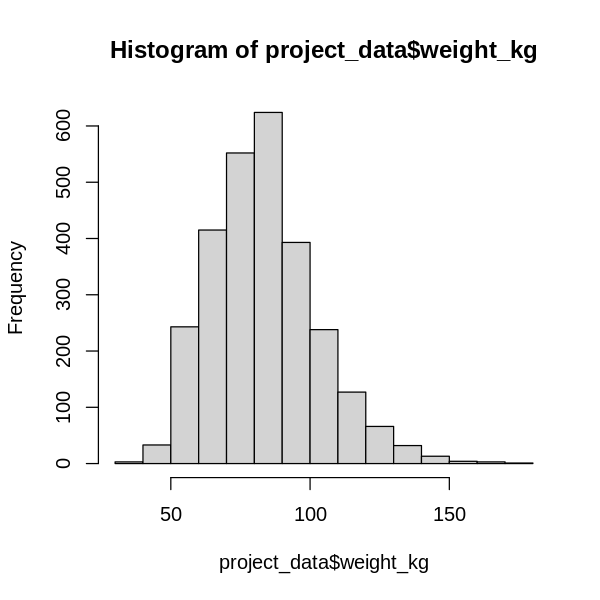

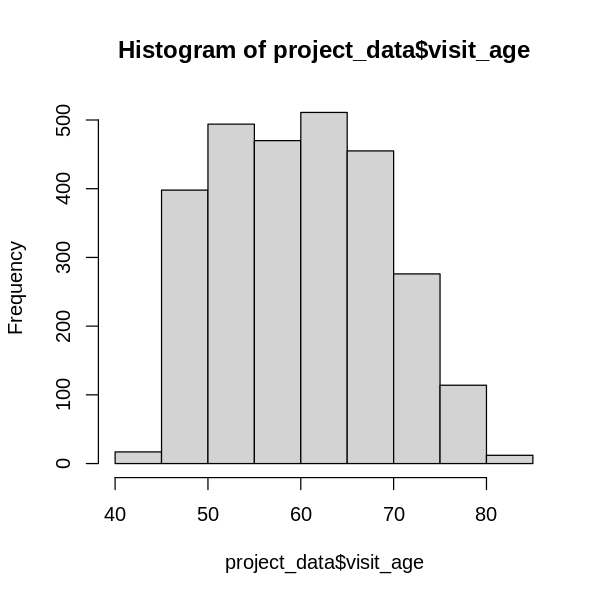

In [ ]:
options(repr.plot.width=5, repr.plot.height = 5)
hist(project_data$functional_residual_capacity)
hist(project_data$pct_gastrapping)
hist(project_data$SmokStartAge)
hist(project_data$Duration_Smoking)
hist(project_data$FEV1_phase2)
hist(project_data$sysBP)
hist(project_data$FVC)
hist(project_data$FEV1_FVC_ratio)
hist(project_data$FEV1)
hist(project_data$pct_emphysema)
hist(project_data$weight_kg)
hist(project_data$visit_age)



`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


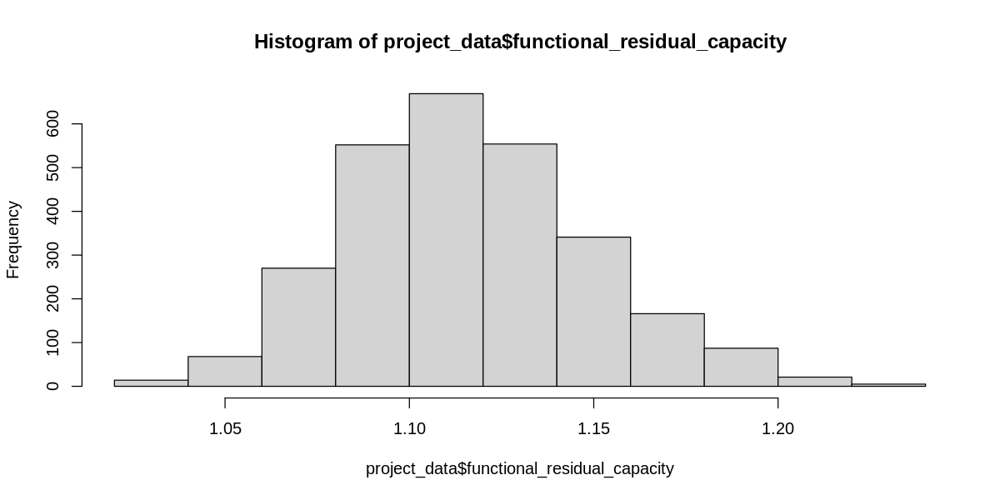

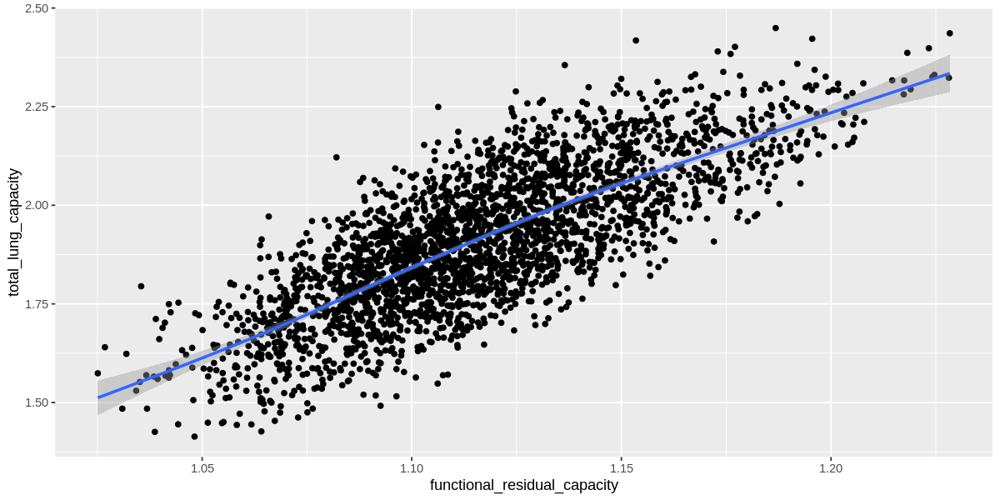

In [ ]:
project_data$functional_residual_capacity = project_data$functional_residual_capacity^0.1
hist(project_data$functional_residual_capacity)
ggplot(project_data, aes(x =functional_residual_capacity, y =total_lung_capacity )) +
  geom_point() +
  stat_smooth()

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


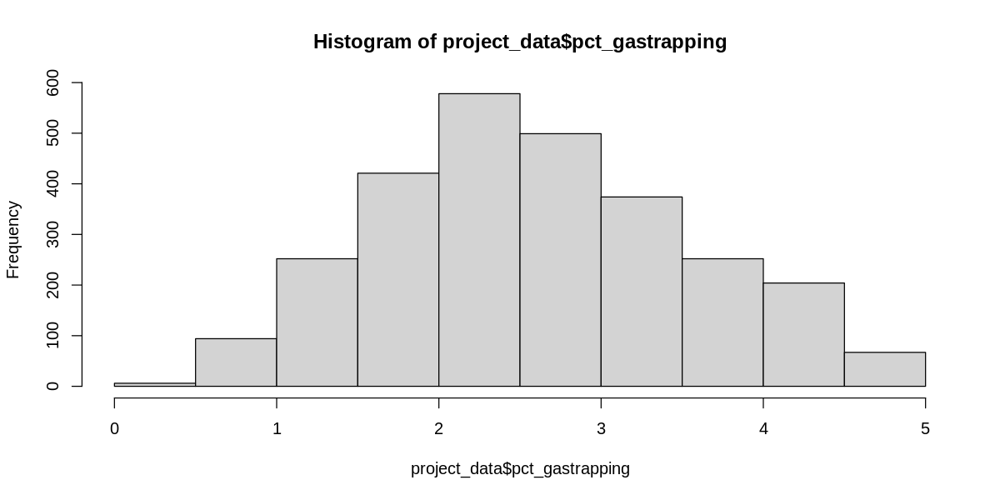

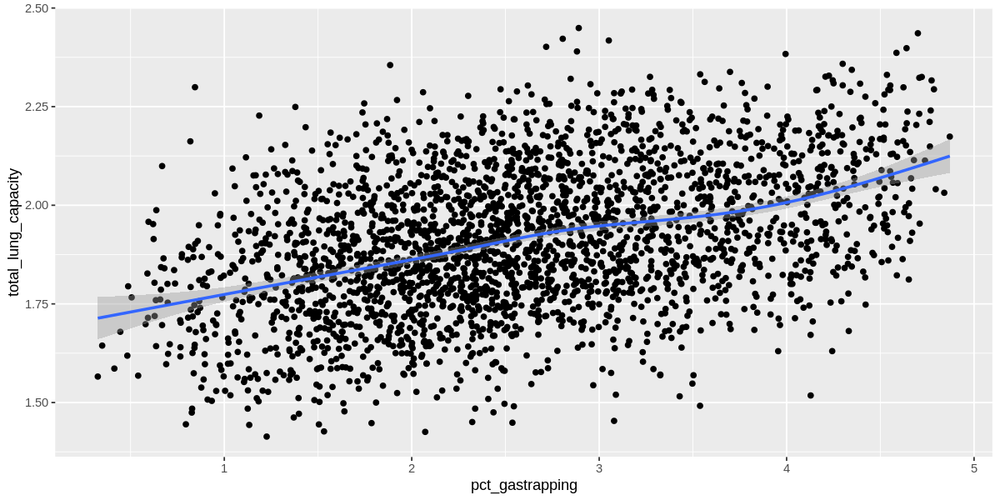

In [ ]:
project_data$pct_gastrapping = project_data$pct_gastrapping^0.36
hist(project_data$pct_gastrapping)
ggplot(project_data, aes(x =pct_gastrapping , y =total_lung_capacity)) +
  geom_point() +
  stat_smooth()

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


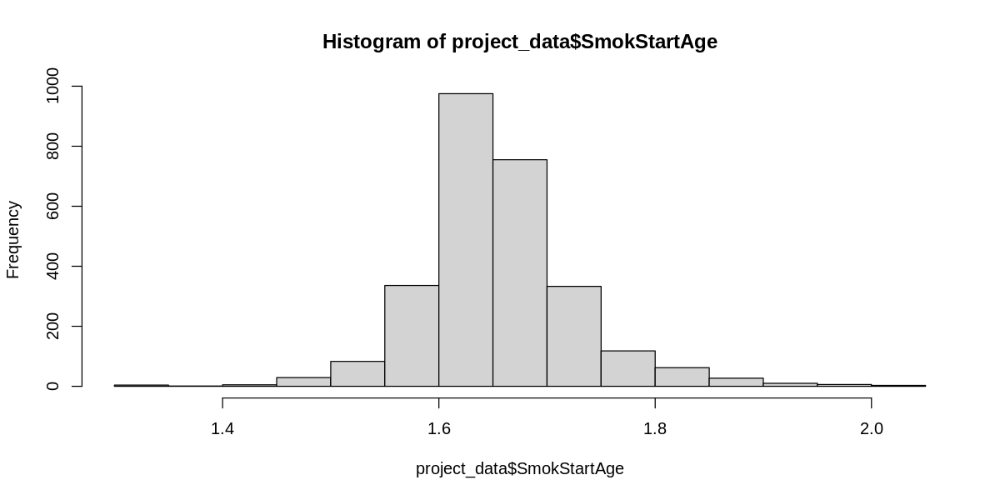

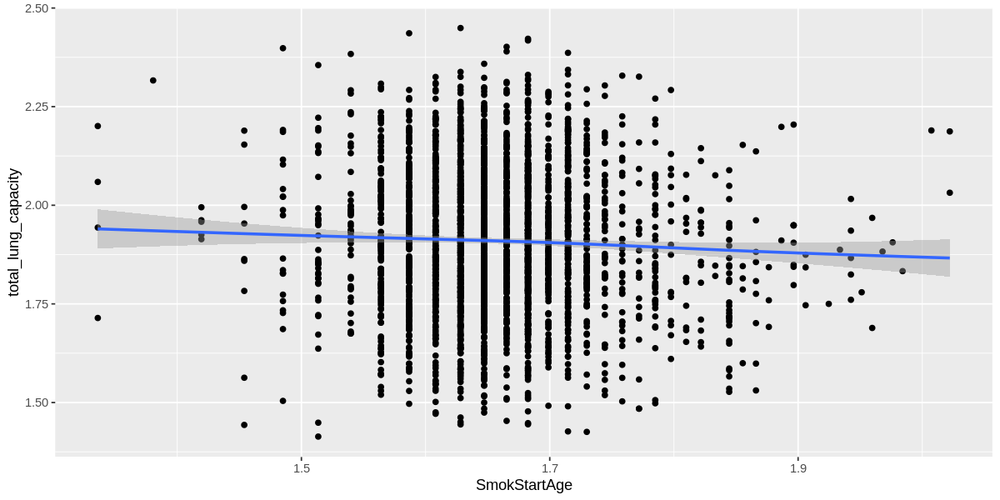

In [ ]:
project_data$SmokStartAge = project_data$SmokStartAge^0.18
hist(project_data$SmokStartAge)
ggplot(project_data, aes(x =SmokStartAge, y = total_lung_capacity)) +
  geom_point() +
  stat_smooth()

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


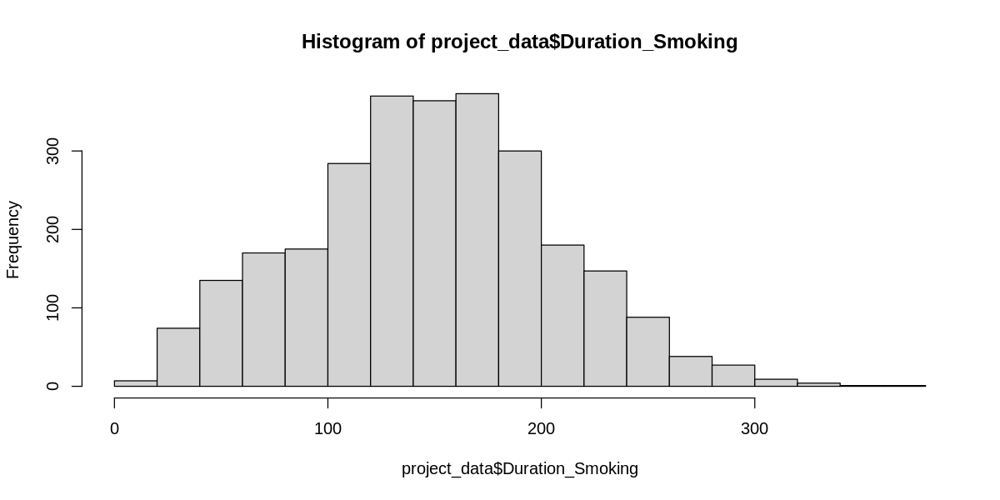

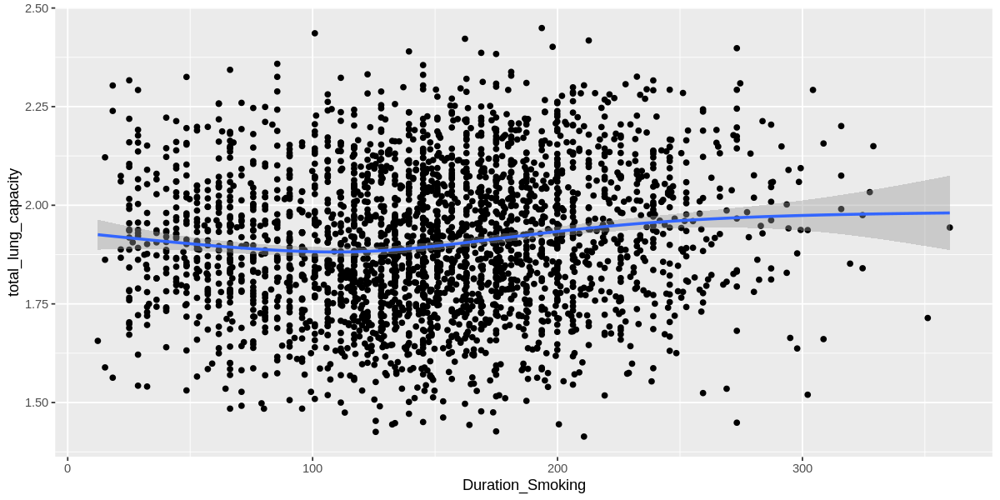

In [ ]:
project_data$Duration_Smoking = project_data$Duration_Smoking^1.4
hist(project_data$Duration_Smoking)
ggplot(project_data, aes(x = Duration_Smoking, y = total_lung_capacity)) +
  geom_point() +
  stat_smooth()

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


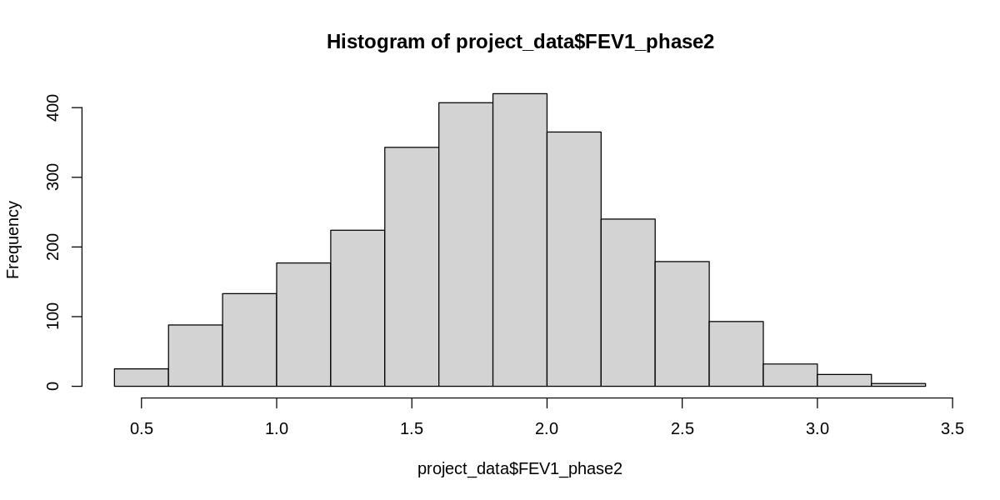

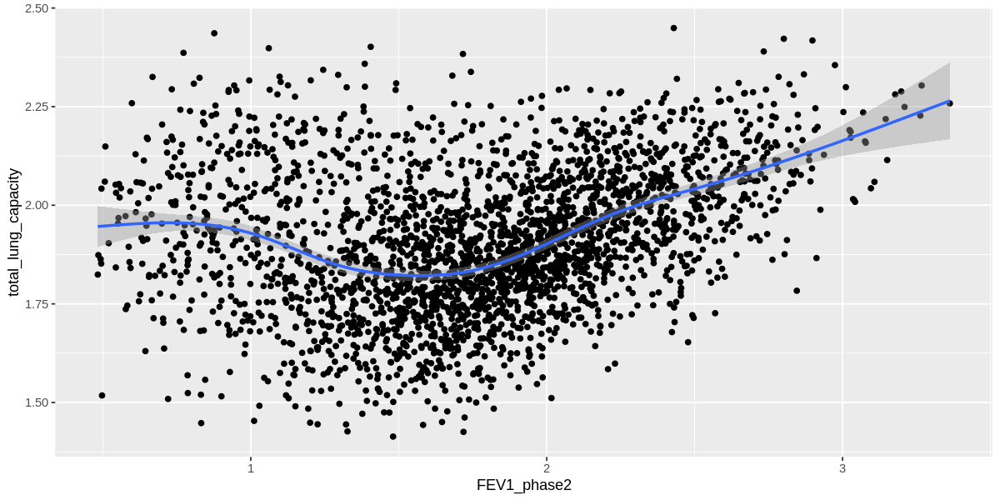

In [ ]:
project_data$FEV1_phase2 = project_data$FEV1_phase2^0.75
hist(project_data$FEV1_phase2)
ggplot(project_data, aes(x =FEV1_phase2, y = total_lung_capacity)) +
  geom_point() +
  stat_smooth()

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


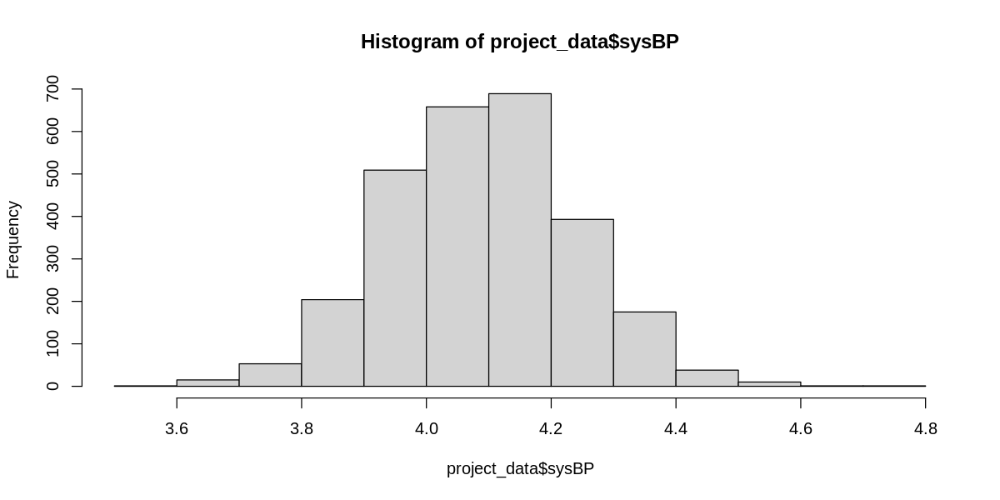

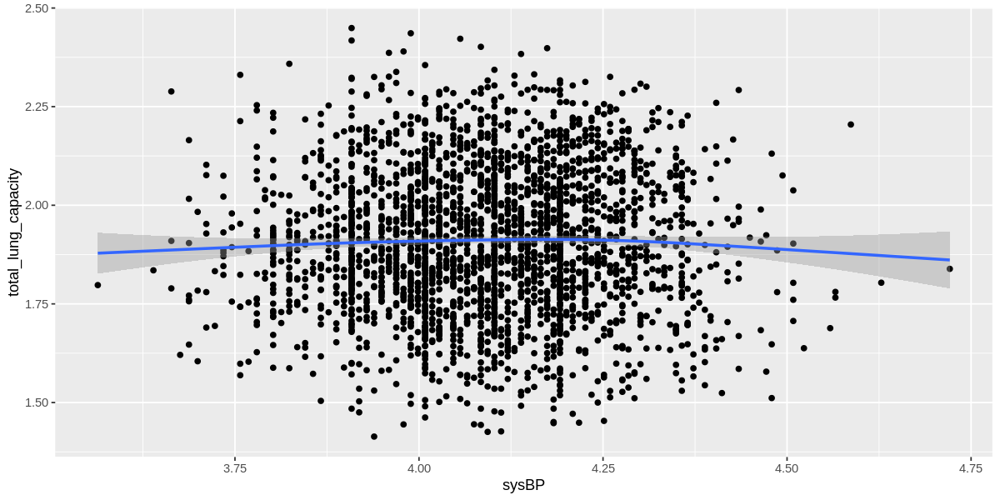

In [ ]:
project_data$sysBP = project_data$sysBP^0.29
hist(project_data$sysBP)
ggplot(project_data, aes(x = sysBP, y = total_lung_capacity)) +
  geom_point() +
  stat_smooth()

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


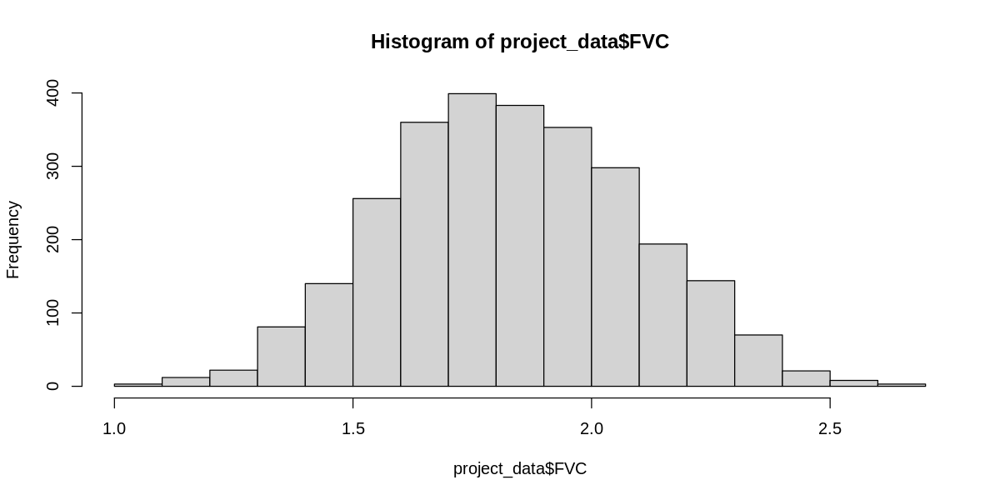

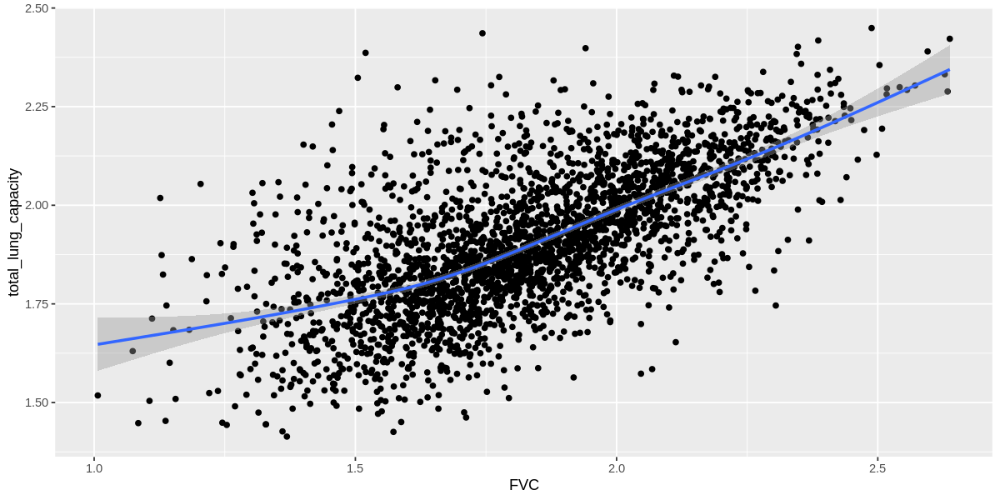

In [ ]:
project_data$FVC = project_data$FVC^0.5
hist(project_data$FVC)
ggplot(project_data, aes(x = FVC, y = total_lung_capacity)) +
  geom_point() +
  stat_smooth()

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


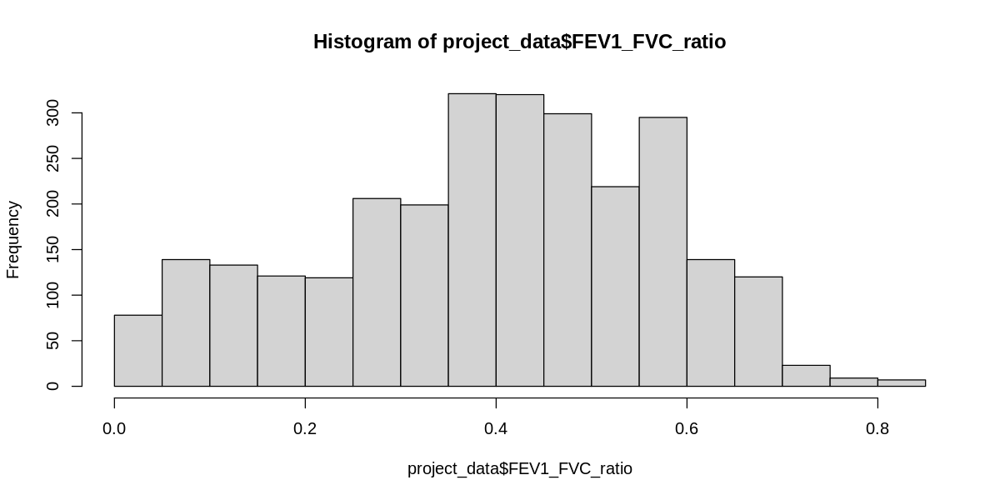

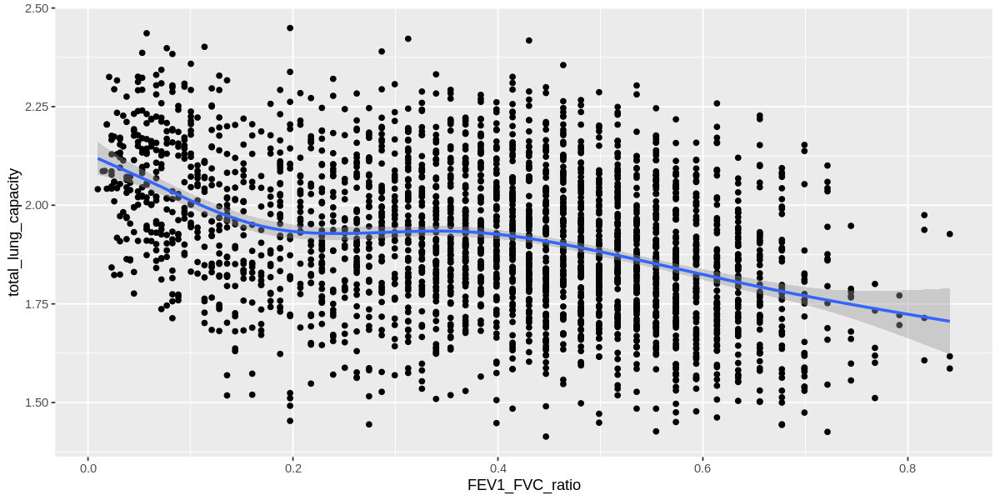

In [ ]:
project_data$FEV1_FVC_ratio = project_data$FEV1_FVC_ratio^2.8
hist(project_data$FEV1_FVC_ratio)
ggplot(project_data, aes(x = FEV1_FVC_ratio, y = total_lung_capacity)) +
  geom_point() +
  stat_smooth()

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


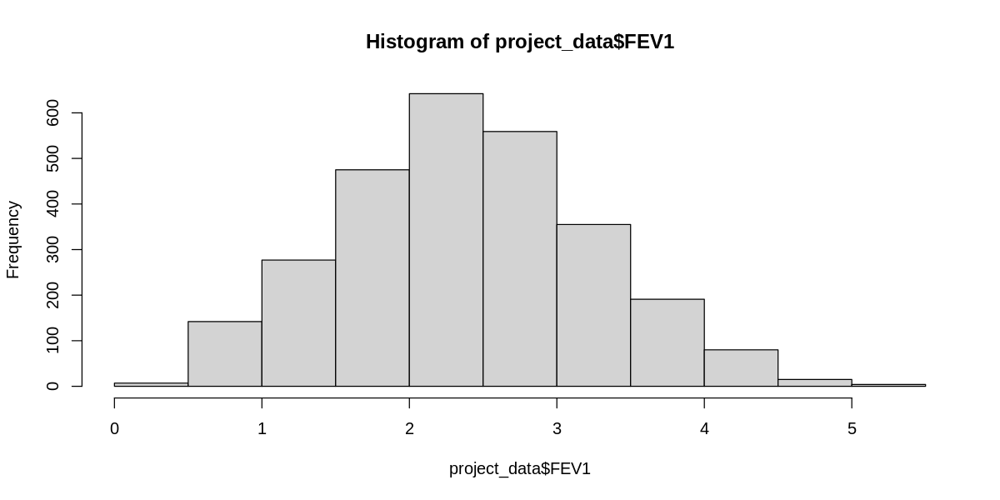

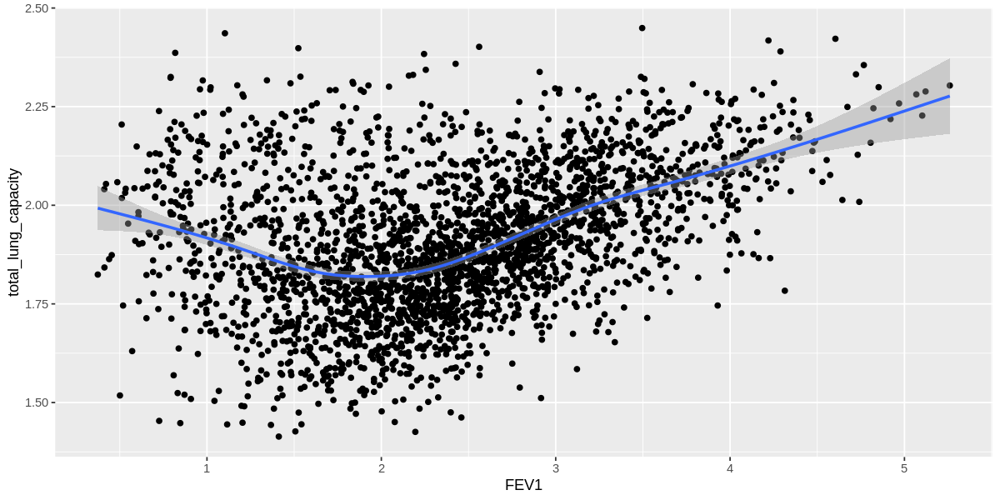

In [ ]:
project_data$FEV1 = project_data$FEV1
hist(project_data$FEV1)
ggplot(project_data, aes(FEV1, y = total_lung_capacity)) +
  geom_point() +
  stat_smooth()

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


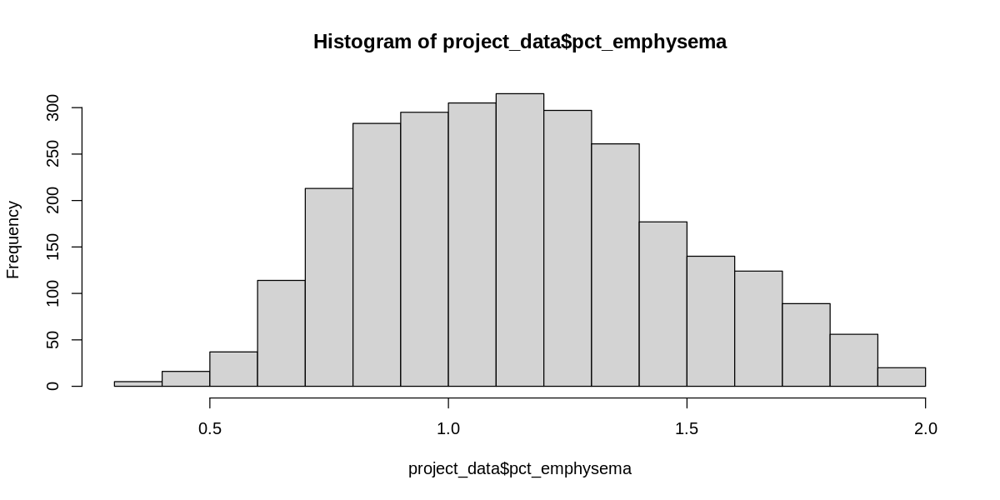

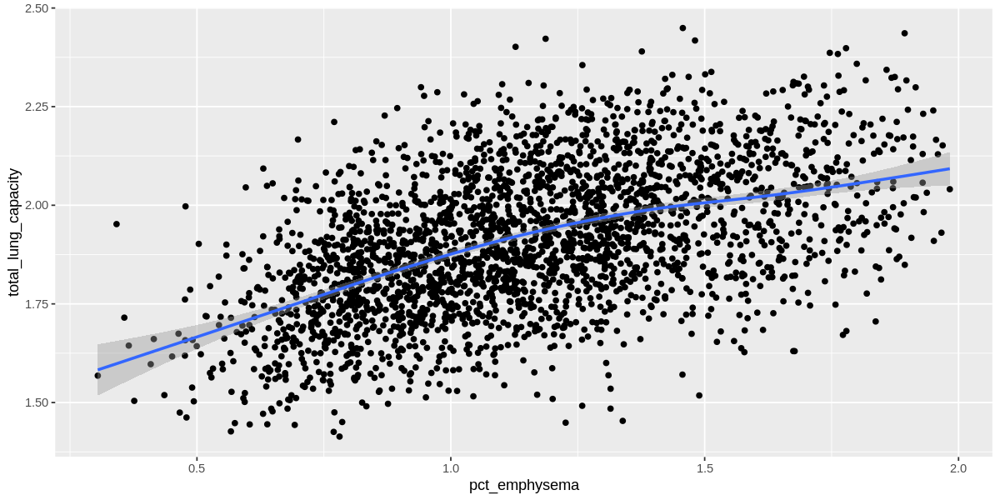

In [ ]:
project_data$pct_emphysema = project_data$pct_emphysema^0.17
hist(project_data$pct_emphysema)
ggplot(project_data, aes(x = pct_emphysema, y = total_lung_capacity)) +
  geom_point() +
  stat_smooth()

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


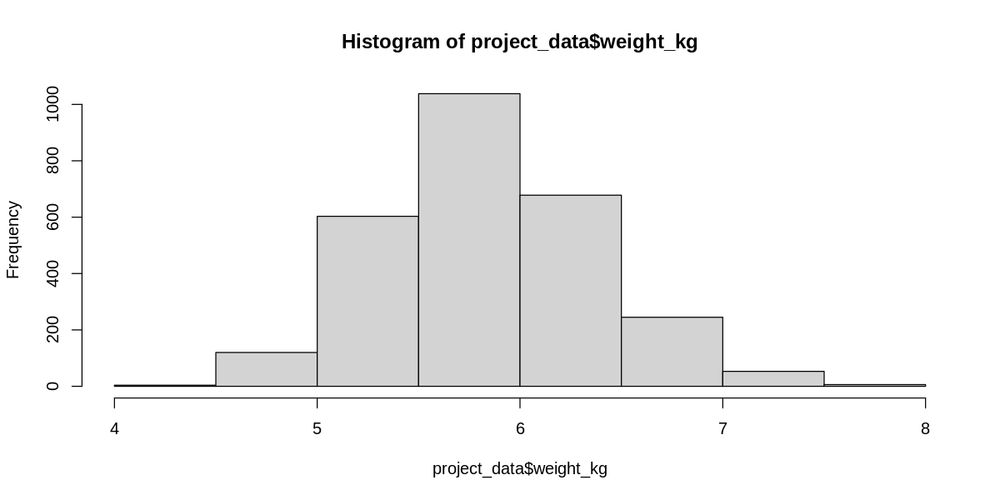

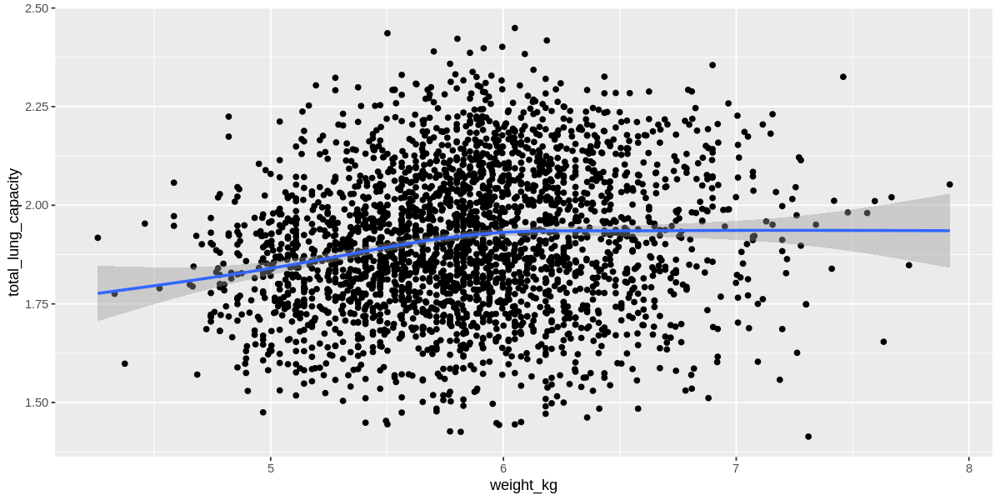

In [ ]:
project_data$weight_kg = project_data$weight_kg^0.4
hist(project_data$weight_kg)
ggplot(project_data, aes(x = weight_kg, y = total_lung_capacity)) +
  geom_point() +
  stat_smooth()

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


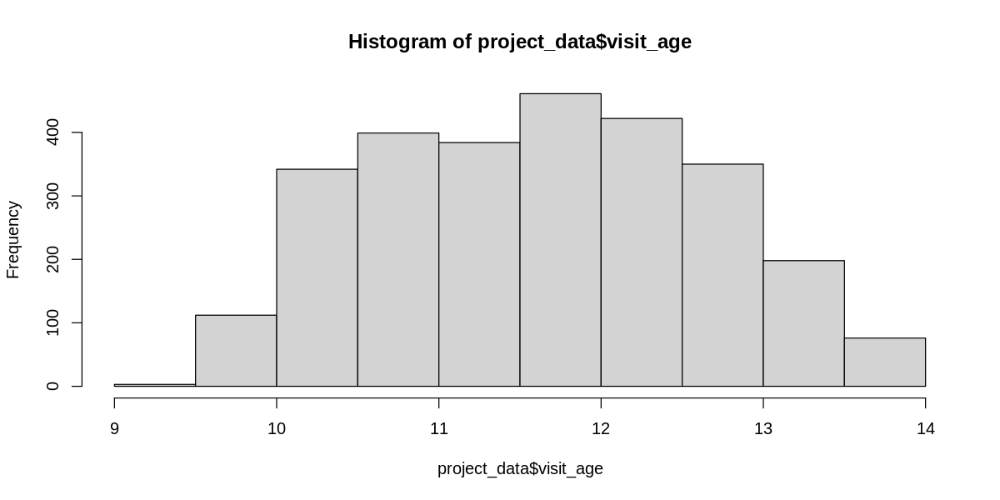

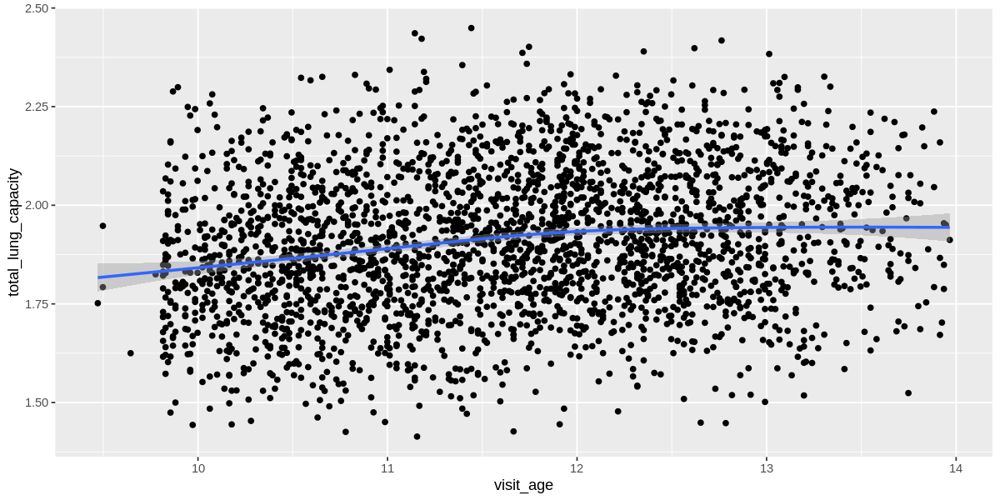

In [ ]:
project_data$visit_age = project_data$visit_age^0.6
hist(project_data$visit_age)
ggplot(project_data, aes(x = visit_age, y = total_lung_capacity)) +
  geom_point() +
  stat_smooth()

Warning message in warn_if_args_exist(list(...)):
“Extra arguments: 'binwidth' are being ignored.  If these are meant to be aesthetics, submit them using the 'mapping' variable within ggpairs with ggplot2::aes or ggplot2::aes_string.”


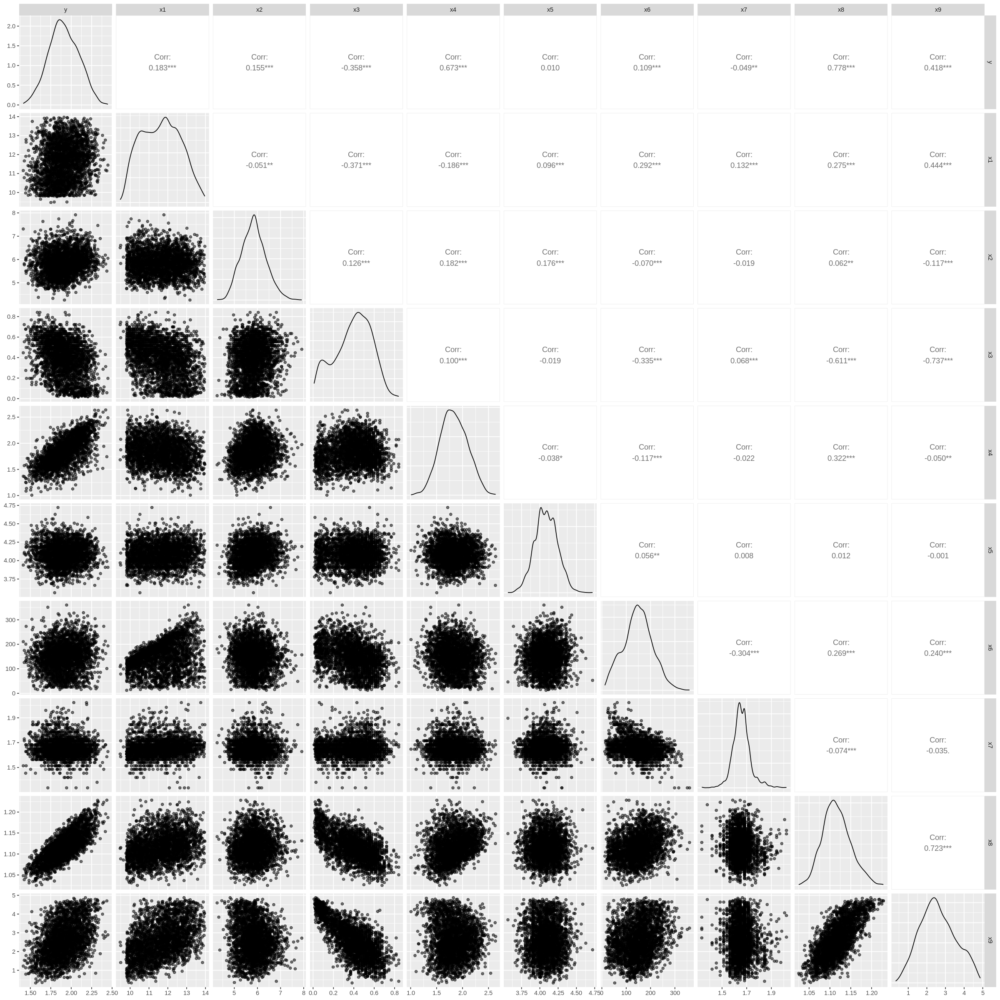

In [ ]:
options(repr.plot.width= 20, repr.plot.height=20)
y=project_data$total_lung_capacity
x1=project_data$visit_age
x2=project_data$weight_kg
x3=project_data$FEV1_FVC_ratio
x4=project_data$FVC
x5=project_data$sysBP
x6=project_data$Duration_Smoking
x7=project_data$SmokStartAge
x8=project_data$functional_residual_capacity
x9=project_data$pct_gastrapping
plot_frame <- data.frame(y,x1,x2,x3,x4,x5,x6,x7,x8,x9)
ggpairs(plot_frame, aes(alpha=0.5), binwidth=30)

In [ ]:
fit1 <- lm(total_lung_capacity~functional_residual_capacity, data= project_data)
fit2 <- lm(total_lung_capacity~ pct_gastrapping, data= project_data)
fit3 <- lm(total_lung_capacity~SmokStartAge, data= project_data)
fit4 <- lm(total_lung_capacity~Duration_Smoking, data= project_data)
fit5 <- lm(total_lung_capacity~FVC, data= project_data)
fit6 <- lm(total_lung_capacity~sysBP, data= project_data)
fit7 <- lm(total_lung_capacity~FEV1_FVC_ratio, data= project_data)
fit8 <- lm(total_lung_capacity~weight_kg, data= project_data)
fit9 <- lm(total_lung_capacity~visit_age, data= project_data)


In [ ]:
BIC(fit1)
BIC(fit2)
BIC(fit3)
BIC(fit4)
BIC(fit5)
BIC(fit6)
BIC(fit7)
BIC(fit8)
BIC(fit9)

[1] -4132.208

[1] -2104.949

[1] -1583.748

[1] -1609.951

[1] -3232.76

[1] -1577.366

[1] -1953.125

[1] -1644.096

[1] -1670.916

In [ ]:
# regression subsets selection
preds <- with(project_data, cbind(functional_residual_capacity,pct_gastrapping,SmokStartAge,Duration_Smoking,FEV1_phase2,FVC,sysBP,FEV1_FVC_ratio,
                          FEV1,pct_emphysema,weight_kg,visit_age))

model = regsubsets(preds, y = project_data$total_lung_capacity,
                   nbest = 30,    # save the best # for each number of variables
                   nvmax = 20,    # maximum number of variables allowed in the model
                   really.big=T)  # for larger datasets

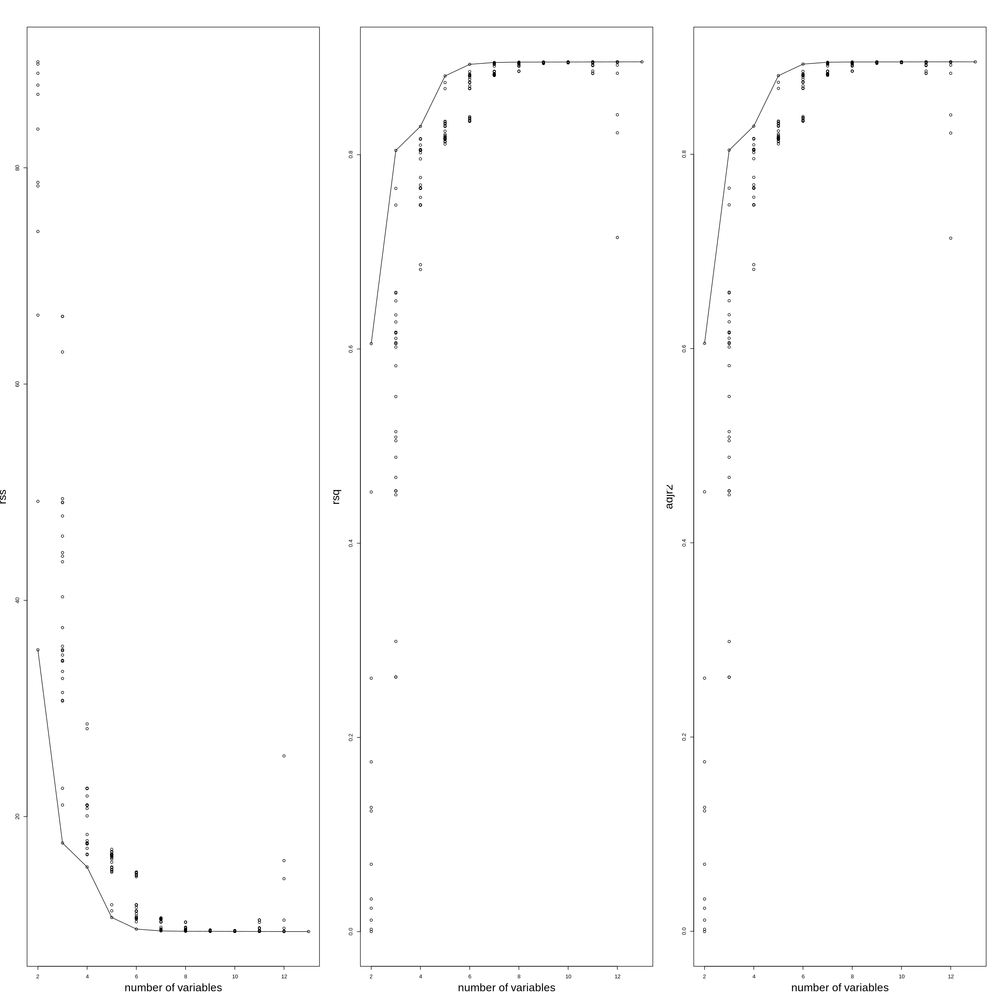

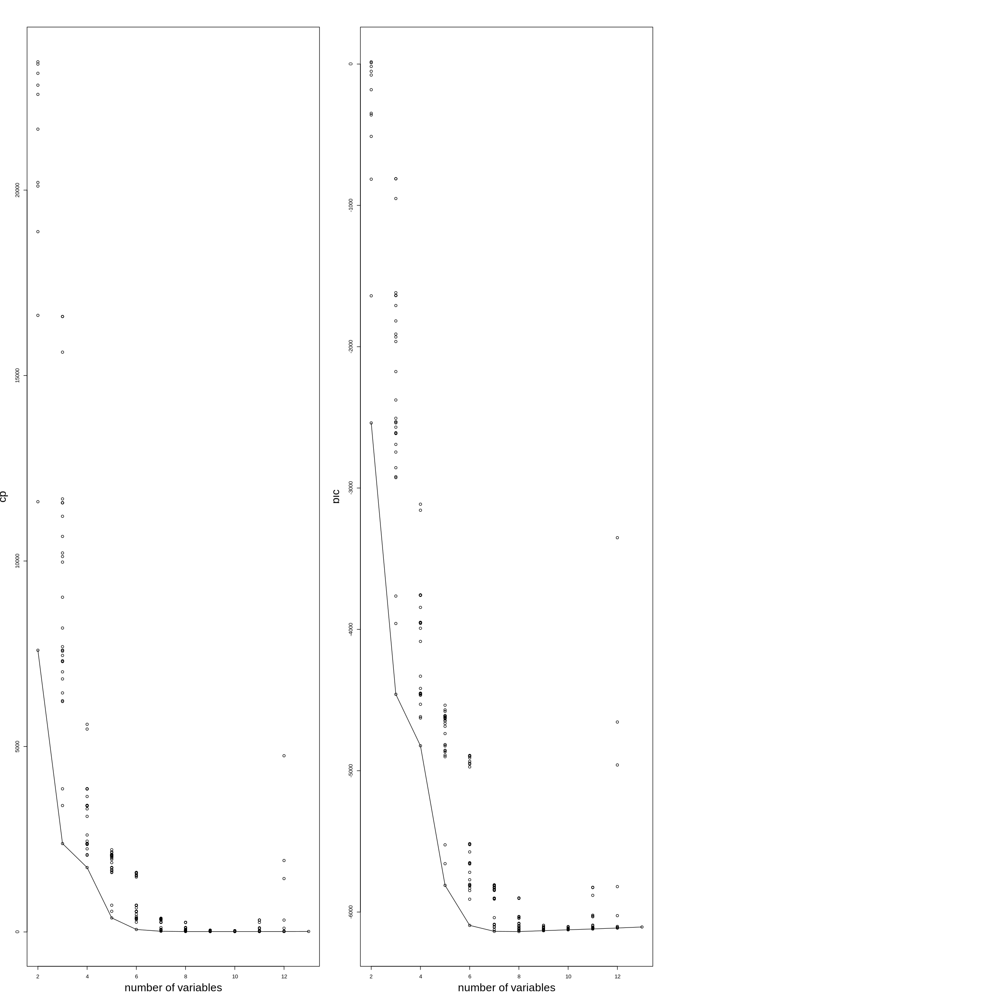

In [ ]:
par(mfrow=c(1, 3))

plot_best <- function(number_variables, crit, func) {

    # plot criteria vs number of variables
    plot(number_variables, model_summ[[crit]],
         xlab = "number of variables", ylab = crit,
         cex.lab = 2)

    # plot line for visualization
    lines(unique(number_variables), tapply(model_summ[[crit]], number_variables, match.fun(func)))

}


model_summ <- summary(model)  # store the summary of the best subsets

# plot criteria vs number of variables
number_variables <- apply(model_summ$which, 1, sum)
plot_best(number_variables, 'rss', 'min')
plot_best(number_variables, 'rsq', 'max')
plot_best(number_variables, 'adjr2', 'max')
plot_best(number_variables, 'cp', 'min')
plot_best(number_variables, 'bic', 'min')

In [ ]:
# create dataframe of metrics
criteria <- data.frame(p = number_variables,
                       rss = model_summ$rss,
                       rsq = model_summ$rsq,
                       adjr2 = model_summ$adjr2,
                       cp = model_summ$cp,
                       bic = model_summ$bic)


# shows all criteria and included variables ordered by bic
criteria <- cbind(criteria, model_summ$outmat)
print(head(criteria[order(criteria$bic),]))


         p      rss       rsq     adjr2       cp       bic
7  ( 1 ) 8 9.394553 0.8953873 0.8951200 10.22685 -6137.981
6  ( 1 ) 7 9.426503 0.8950315 0.8948017 17.54972 -6136.572
8  ( 1 ) 9 9.388035 0.8954599 0.8951545 10.32503 -6131.969
8  ( 2 ) 9 9.389782 0.8954405 0.8951349 10.83493 -6131.458
8  ( 3 ) 9 9.390907 0.8954279 0.8951224 11.16305 -6131.129
8  ( 4 ) 9 9.391375 0.8954227 0.8951172 11.29975 -6130.992
         functional_residual_capacity pct_gastrapping SmokStartAge
7  ( 1 )                            *               *             
6  ( 1 )                            *               *             
8  ( 1 )                            *               *            *
8  ( 2 )                            *               *             
8  ( 3 )                            *               *             
8  ( 4 )                            *               *             
         Duration_Smoking FEV1_phase2 FVC sysBP FEV1_FVC_ratio FEV1
7  ( 1 )                *           *   *         

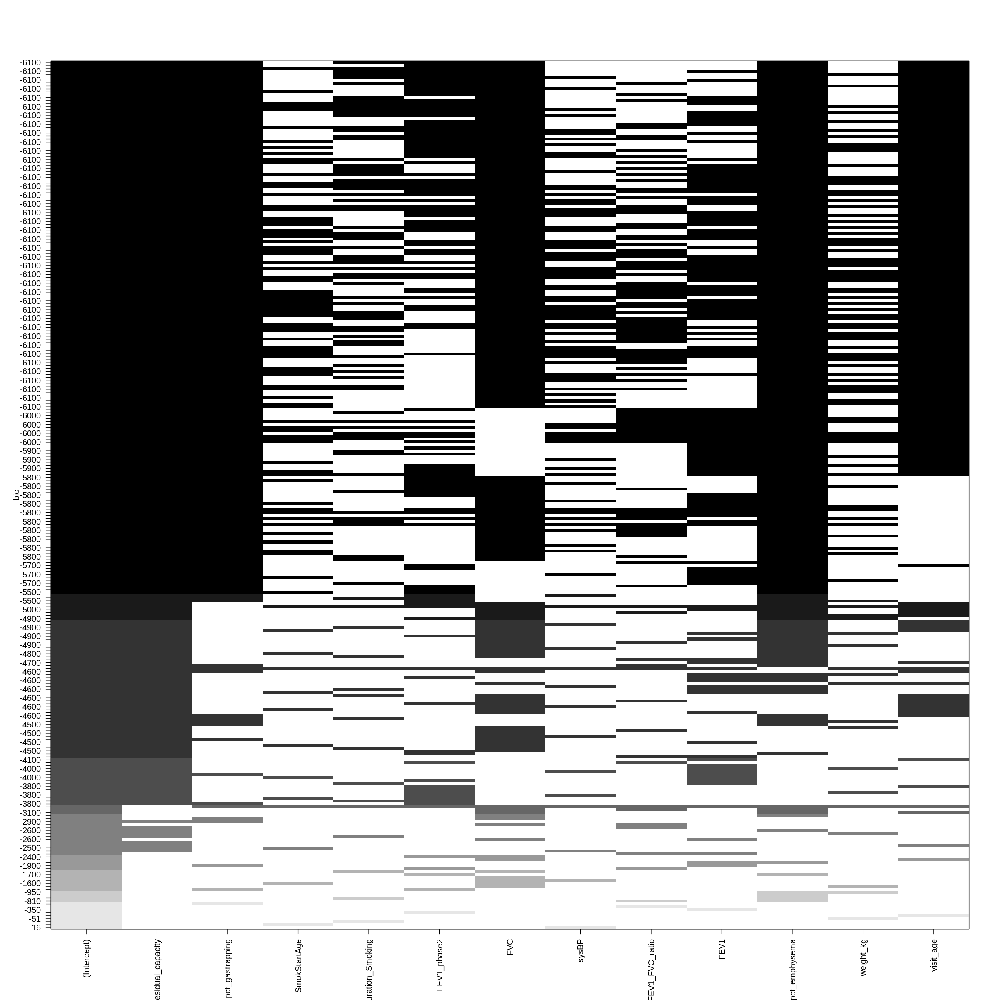

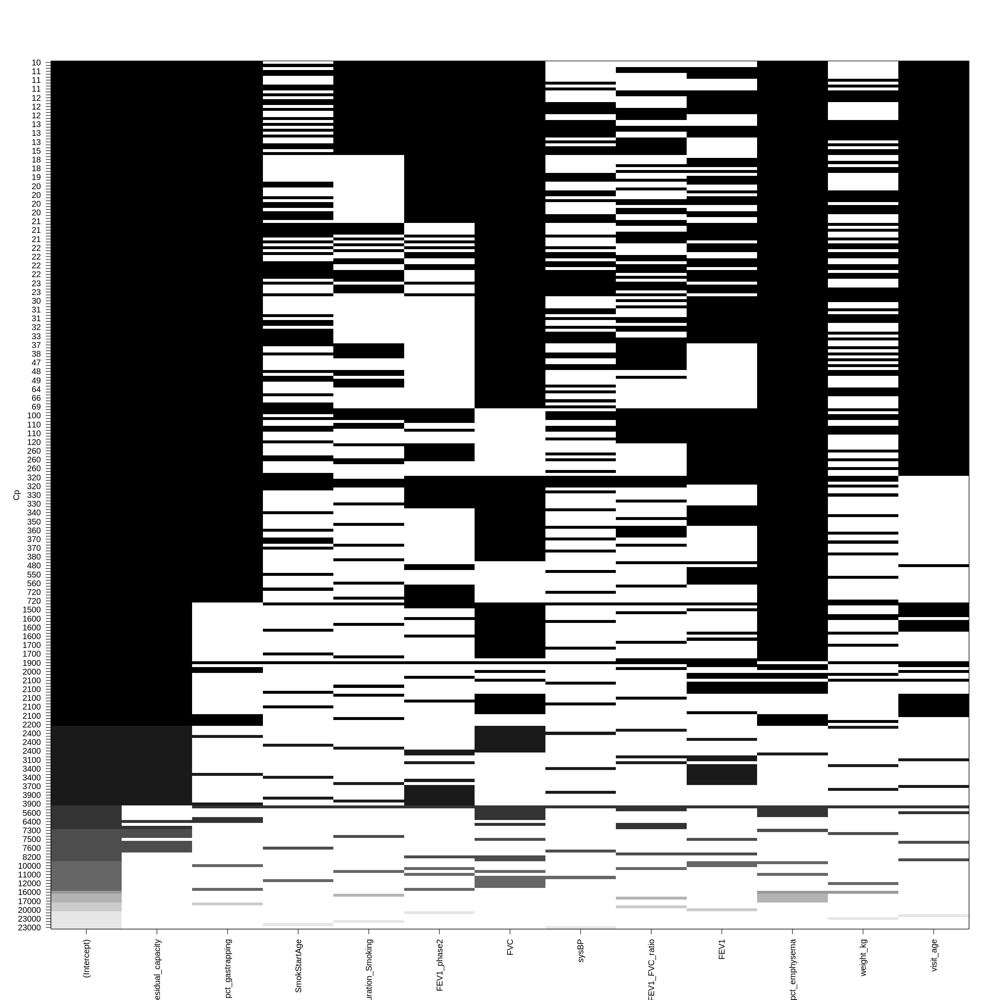

In [ ]:
plot(model, scale = "bic")
plot(model, scale = "Cp")


Call:
lm(formula = project_data$total_lung_capacity ~ project_data$visit_age + 
    project_data$functional_residual_capacity + project_data$pct_gastrapping)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.30418 -0.07398  0.00003  0.07077  0.34766 

Coefficients:
                                           Estimate Std. Error t value Pr(>|t|)
(Intercept)                               -4.169778   0.098849 -42.183  < 2e-16
project_data$visit_age                     0.009701   0.002250   4.312 1.67e-05
project_data$functional_residual_capacity  5.491458   0.089575  61.306  < 2e-16
project_data$pct_gastrapping              -0.063286   0.003350 -18.894  < 2e-16
                                             
(Intercept)                               ***
project_data$visit_age                    ***
project_data$functional_residual_capacity ***
project_data$pct_gastrapping              ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error:

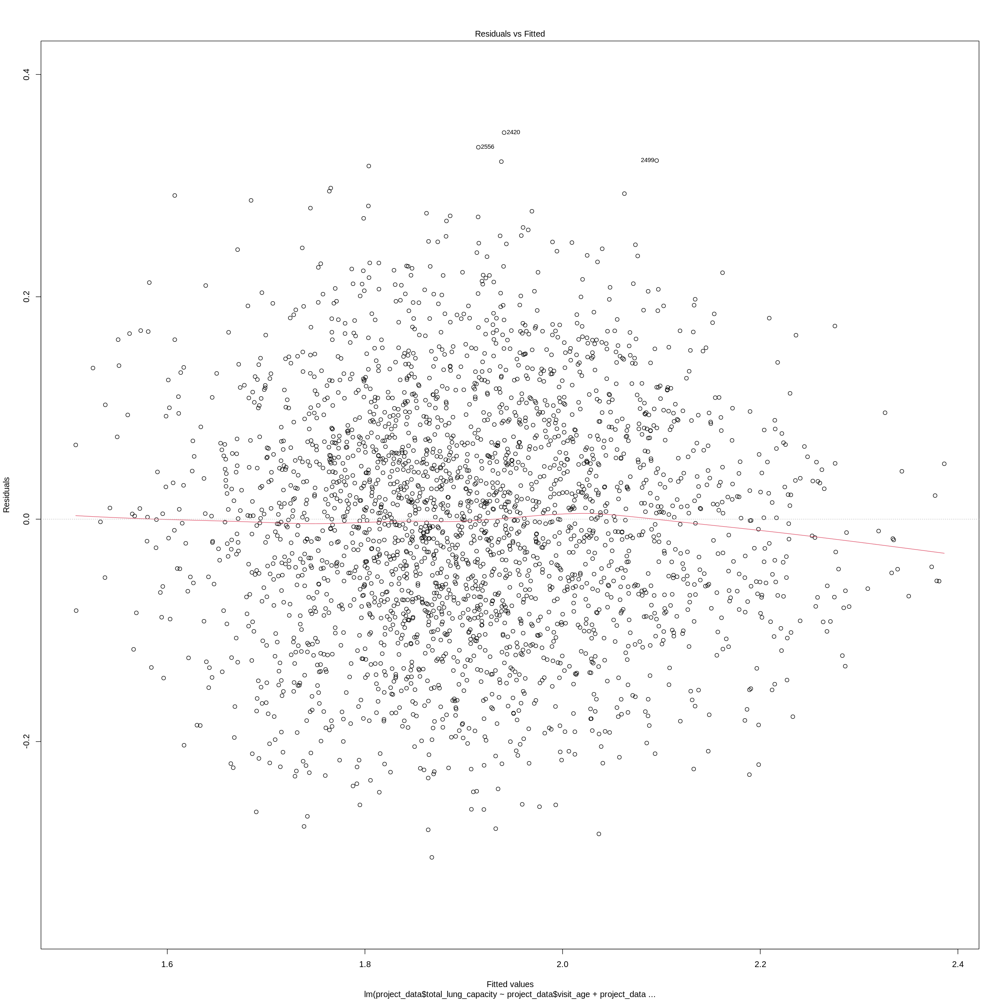

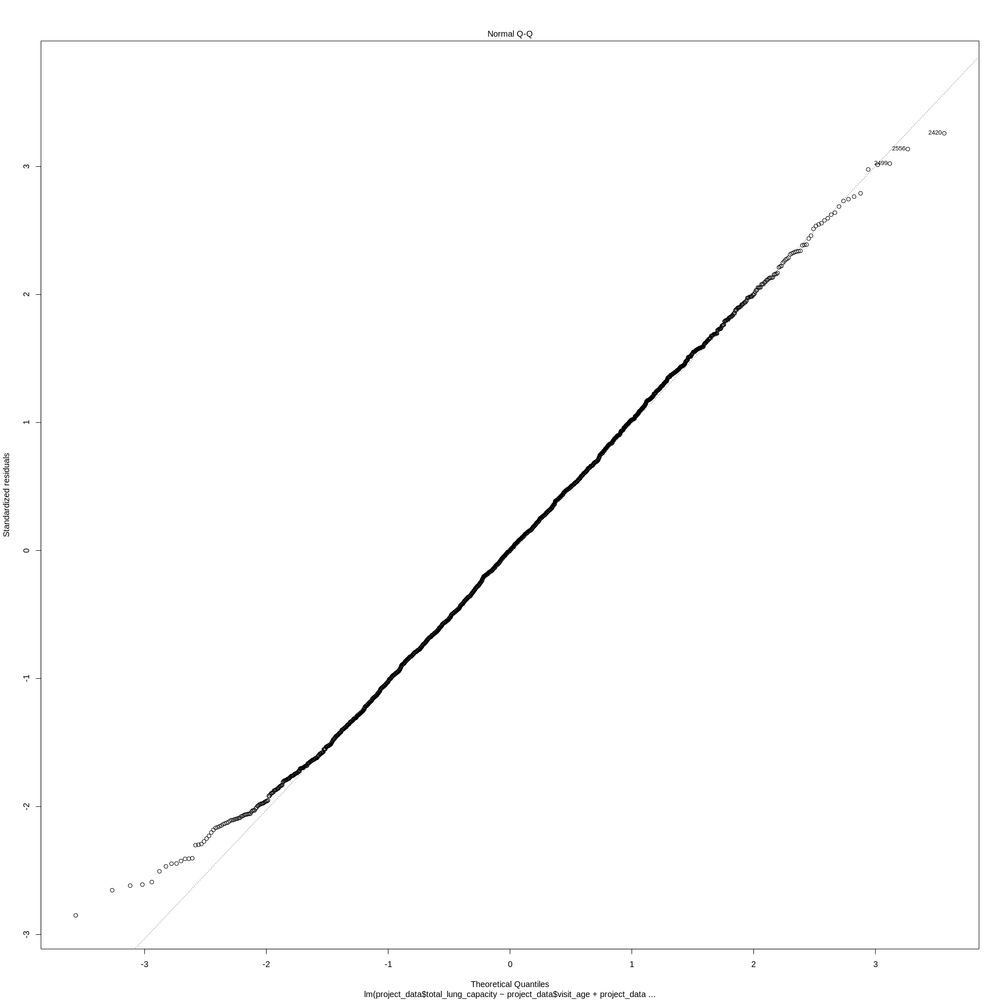

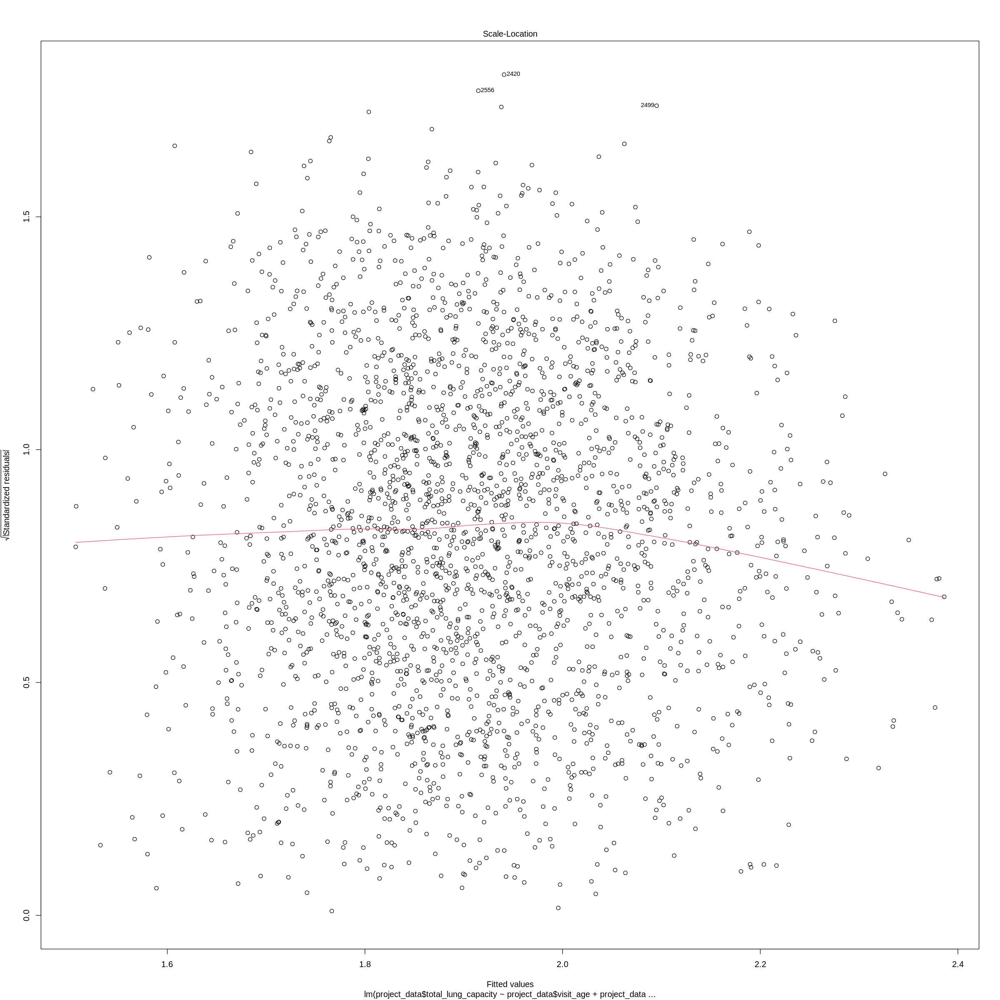

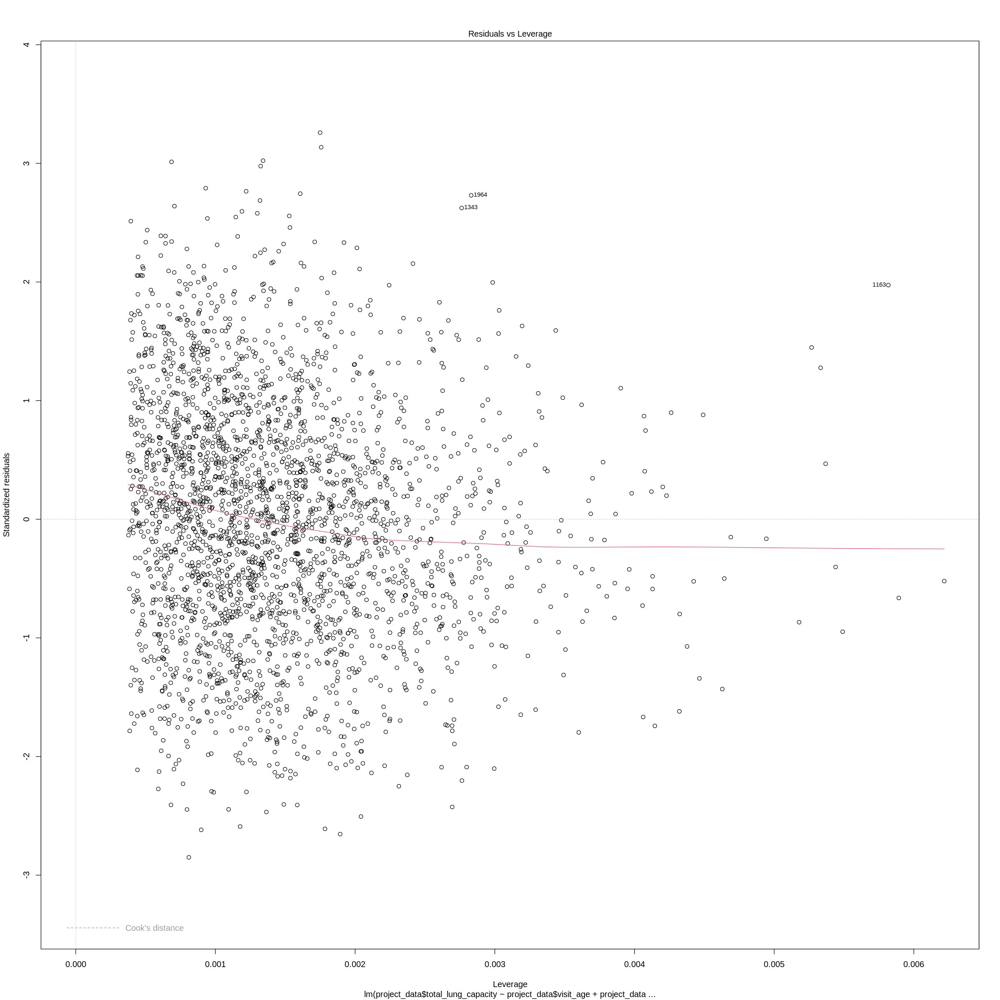

In [ ]:

model <- lm(project_data$total_lung_capacity ~ project_data$visit_age+project_data$functional_residual_capacity+
             project_data$pct_gastrapping )
summary(model)
plot(model)


Call:
lm(formula = project_data$total_lung_capacity ~ project_data$visit_age + 
    project_data$functional_residual_capacity)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.32261 -0.08212 -0.00250  0.08102  0.37319 

Coefficients:
                                           Estimate Std. Error t value Pr(>|t|)
(Intercept)                               -2.832974   0.073369 -38.613  < 2e-16
project_data$visit_age                    -0.005990   0.002222  -2.696  0.00707
project_data$functional_residual_capacity  4.310318   0.068187  63.214  < 2e-16
                                             
(Intercept)                               ***
project_data$visit_age                    ** 
project_data$functional_residual_capacity ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.1135 on 2744 degrees of freedom
Multiple R-squared:  0.6065,	Adjusted R-squared:  0.6063 
F-statistic:  2115 on 2 and 2744 DF,  p-value: < 2.2e-16


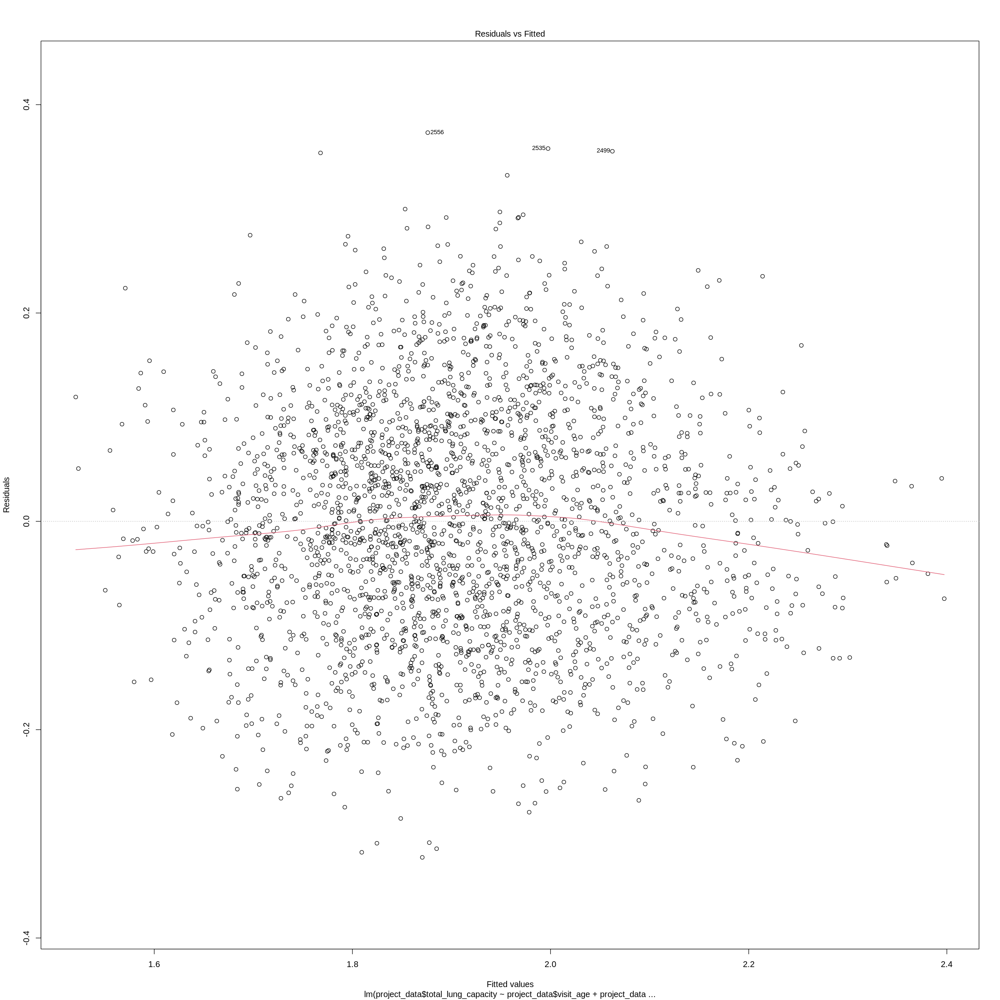

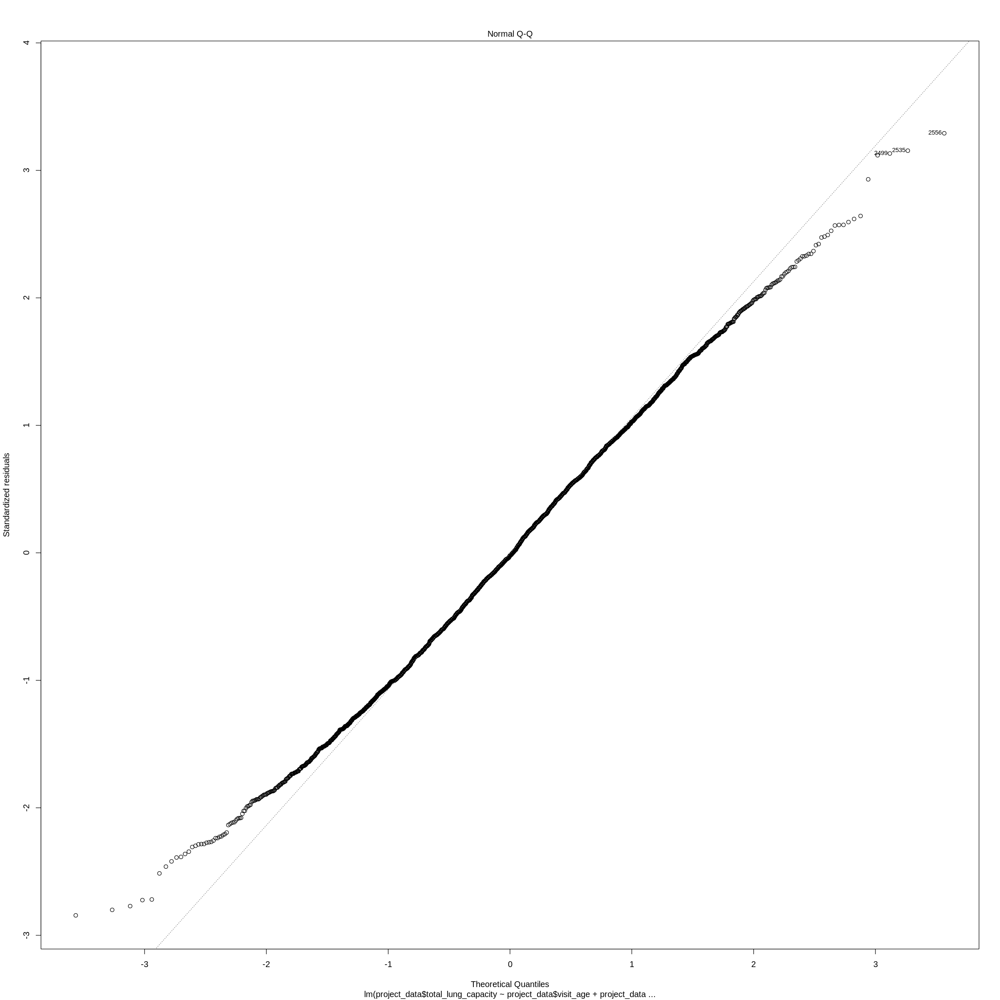

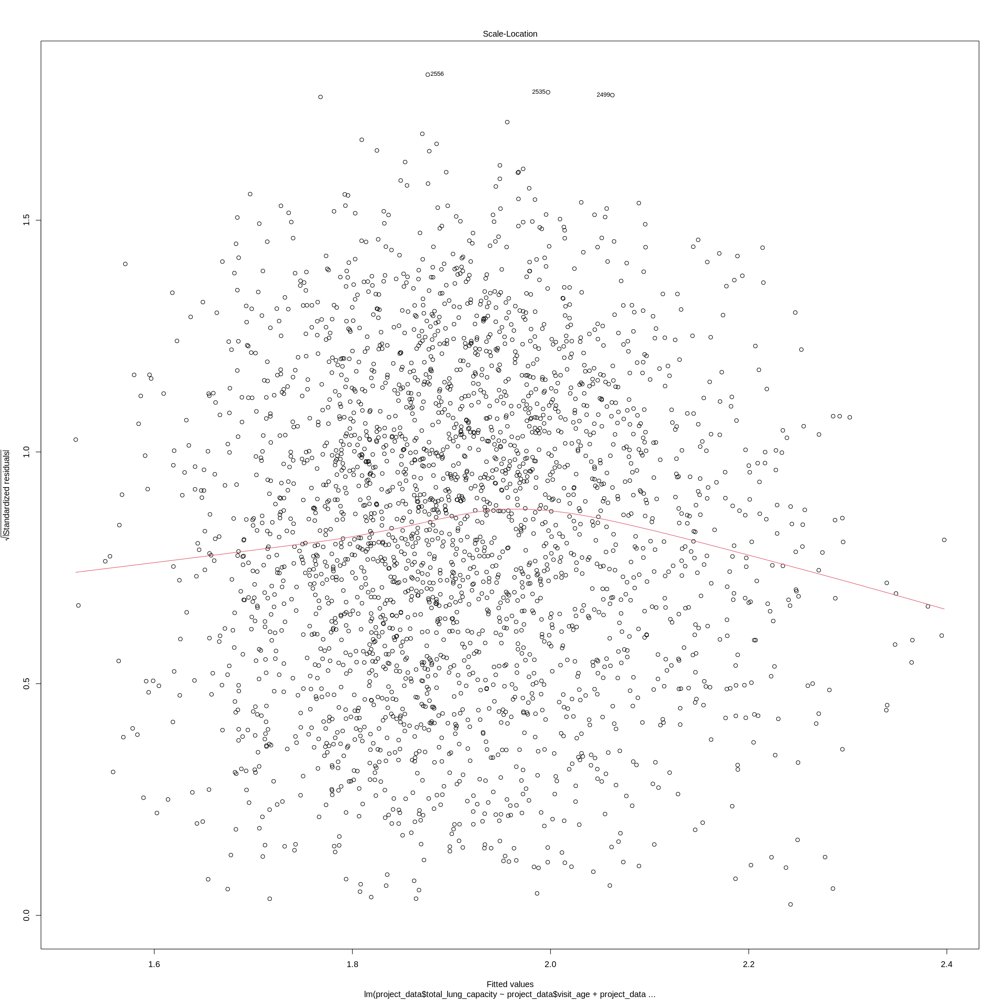

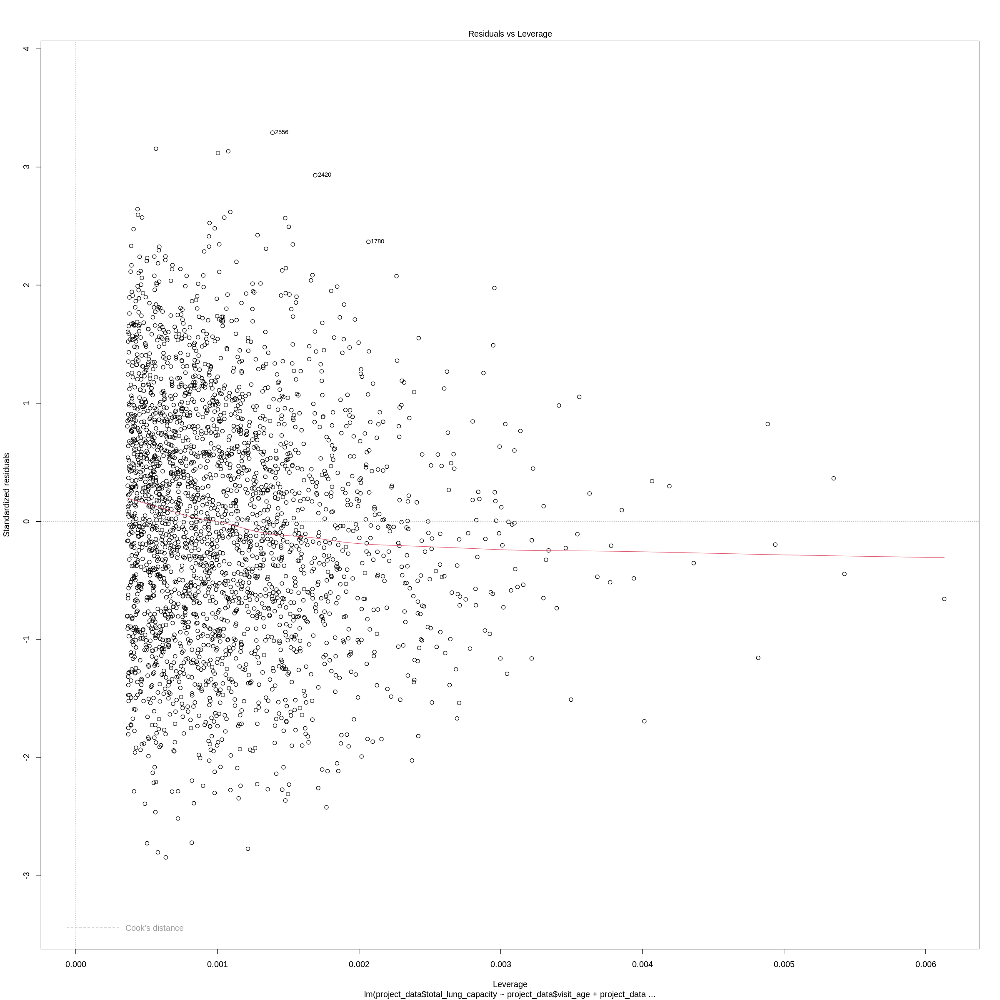

In [ ]:
model1 <- lm(project_data$total_lung_capacity ~ project_data$visit_age+ project_data$functional_residual_capacity )
summary(model1)
plot(model1)

In [ ]:
# VIF for each predictor
print(vif(model1))
print(paste("max VIF:", max(vif(model1))))

                   project_data$visit_age 
                                 1.082039 
project_data$functional_residual_capacity 
                                 1.082039 
[1] "max VIF: 1.08203882583156"


In [ ]:
# mean VIF
print(paste("mean VIF:", mean(vif(model1))))

[1] "mean VIF: 1.08203882583156"


In [ ]:
# VIF for each predictor
print(vif(model))
print(paste("max VIF:", max(vif(model))))

                   project_data$visit_age 
                                 1.252788 
project_data$functional_residual_capacity 
                                 2.109555 
             project_data$pct_gastrapping 
                                 2.428936 
[1] "max VIF: 2.42893583167755"


In [ ]:
# mean VIF
print(paste("mean VIF:", mean(vif(model))))

[1] "mean VIF: 1.93042631119536"
